# Face Generation
In this project, we have used generative adversarial networks to generate new images of faces.
### Get the Data
We'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex, we will test our neural network on MNIST before CelebA.  Running the GANs on MNIST will allow us to see how well your model trains sooner.

In [3]:
data_dir = './data'
data_dir = './input'

import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0k/60.0k [00:06<00:00, 9.65kFile/s]


Extracting celeba...


## Explore the Data
### MNIST
The 'MNIS' dataset contains images of handwritten digits. We can view the first number of examples by changing `show_n_images`. 

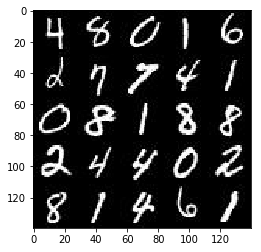

In [4]:
show_n_images = 25

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since we're going to be generating faces, we won't need the annotations.  We can view the first number of examples by changing `show_n_images`.

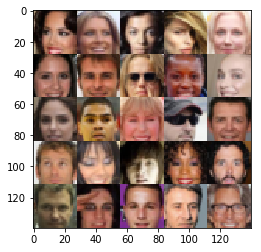

In [5]:
show_n_images = 25

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
The values of the MNIST and CelebA dataset are in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images is cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single color channel while the CelebA images have 3 color channels (RGB color channel).
## Build the Neural Network
We'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [6]:
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.12.0
Default GPU Device: /device:GPU:0


### Input
Let's implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [7]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name = 'input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name = 'input_z')
    learning_rate = tf.placeholder(tf.float32, name = 'learning_rate')
    return input_real, input_z, learning_rate

tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Let's implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use `tf.variable_scope` with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [11]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha=0.1
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same', 
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(x1*alpha, x1)
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128 now
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        # 4x4x256 now
        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits

tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Let's implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network. We will Use `tf.variable_scope` with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [12]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    kinit = tf.random_normal_initializer(stddev=0.02)
    with tf.variable_scope('generator', reuse=(not is_train)):
        alpha=0.1
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*256)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, kernel_initializer=kinit, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, kernel_initializer=kinit, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 3, strides=1, kernel_initializer=kinit, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
    return out

tests.test_generator(generator, tf)

Tests Passed


### Loss
Let's implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  We will use the following functions we implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [18]:
def model_loss(input_real_, input_z_, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z_, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real_)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    ## Label smoothing
    smooth = 0.1
    d_real_labels = tf.ones_like(d_model_real)*(1-smooth)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=d_real_labels))
        
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss

tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Now we will implement `model_opt` to create the optimization operations for the GANs. Use `tf.trainable_variables` to get all the trainable variables. Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [19]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    return d_train_opt, g_train_opt

tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Let's show the current output of the generator during training. It will help us determine how well the GANs is training.

In [20]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Let's implement `train` to build and train the GANs. We will use the following functions we implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

We will use the `show_generator_output` to show `generator` output while we train. Running `show_generator_output` for every batch will drastically increase training time. So we will print the `generator` output every 100 batches.

In [21]:
def train(epoch_count, batch_size, z_dim, learning_rate_, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    _, img_width, img_height, img_channels = data_shape
    real_input = tf.placeholder(tf.float32, (None, img_width, img_height, img_channels), name = 'real_input')
    z_input = tf.placeholder(tf.float32, (None, z_dim), name = 'z_input')
    lr = tf.placeholder(tf.float32, name = 'lr')
    
    d_loss, g_loss = model_loss(real_input, z_input, img_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    steps = 0
    print_every = 10
    show_every = 100
    losses = []
    n_images = 25
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                steps += 1
                batch_images *= 2
                z_sample = np.random.uniform(-1, 1, (batch_size, z_dim))
                                
                sess.run(g_opt, feed_dict={real_input: batch_images, z_input: z_sample, lr: learning_rate_})
                sess.run(d_opt, feed_dict={real_input: batch_images, z_input: z_sample, lr: learning_rate_})
                
                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({z_input: z_sample, real_input: batch_images})
                    train_loss_g = g_loss.eval({z_input: z_sample})
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                           "Discriminator Loss: {:.4f}...".format(train_loss_d),
                           "Generator Loss: {:.4f}".format(train_loss_g))
                    losses.append((train_loss_d, train_loss_g))
                    losses.append((train_loss_d))
                    if steps % show_every == 0:
                          show_generator_output(sess, n_images, z_input, img_channels, data_image_mode)
                            

### MNIST
Let's test our GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits. We need to make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.6101... Generator Loss: 9.0189
Epoch 1/2... Discriminator Loss: 0.5628... Generator Loss: 1.8703
Epoch 1/2... Discriminator Loss: 0.8731... Generator Loss: 3.3390
Epoch 1/2... Discriminator Loss: 0.9745... Generator Loss: 1.0528
Epoch 1/2... Discriminator Loss: 0.9107... Generator Loss: 2.1194
Epoch 1/2... Discriminator Loss: 0.9881... Generator Loss: 1.1771
Epoch 1/2... Discriminator Loss: 1.1474... Generator Loss: 1.1359
Epoch 1/2... Discriminator Loss: 1.2916... Generator Loss: 2.2450
Epoch 1/2... Discriminator Loss: 1.1484... Generator Loss: 1.8336
Epoch 1/2... Discriminator Loss: 0.9930... Generator Loss: 1.3220


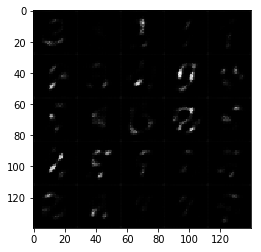

Epoch 1/2... Discriminator Loss: 1.3407... Generator Loss: 2.4297
Epoch 1/2... Discriminator Loss: 1.0759... Generator Loss: 1.6897
Epoch 1/2... Discriminator Loss: 1.0738... Generator Loss: 1.3466
Epoch 1/2... Discriminator Loss: 1.2974... Generator Loss: 2.2240
Epoch 1/2... Discriminator Loss: 1.1926... Generator Loss: 1.9950
Epoch 1/2... Discriminator Loss: 1.1038... Generator Loss: 1.2673
Epoch 1/2... Discriminator Loss: 1.1663... Generator Loss: 0.7701
Epoch 1/2... Discriminator Loss: 1.2095... Generator Loss: 0.6386
Epoch 1/2... Discriminator Loss: 1.1639... Generator Loss: 1.9794
Epoch 1/2... Discriminator Loss: 1.1643... Generator Loss: 1.6788


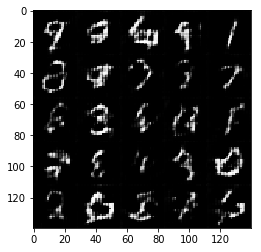

Epoch 1/2... Discriminator Loss: 1.0705... Generator Loss: 1.1848
Epoch 1/2... Discriminator Loss: 1.0986... Generator Loss: 1.1837
Epoch 1/2... Discriminator Loss: 1.4032... Generator Loss: 2.3524
Epoch 1/2... Discriminator Loss: 1.3433... Generator Loss: 2.0684
Epoch 1/2... Discriminator Loss: 1.2144... Generator Loss: 1.7190
Epoch 1/2... Discriminator Loss: 1.1301... Generator Loss: 1.1288
Epoch 1/2... Discriminator Loss: 1.1100... Generator Loss: 0.9294
Epoch 1/2... Discriminator Loss: 1.1559... Generator Loss: 1.2271
Epoch 1/2... Discriminator Loss: 1.2043... Generator Loss: 1.5151
Epoch 1/2... Discriminator Loss: 1.2097... Generator Loss: 1.6326


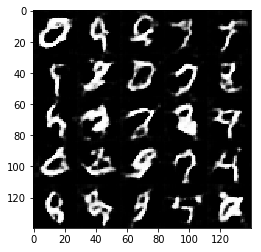

Epoch 1/2... Discriminator Loss: 1.1132... Generator Loss: 0.9905
Epoch 1/2... Discriminator Loss: 1.0843... Generator Loss: 1.2415
Epoch 1/2... Discriminator Loss: 1.1415... Generator Loss: 1.5436
Epoch 1/2... Discriminator Loss: 1.3276... Generator Loss: 0.6524
Epoch 1/2... Discriminator Loss: 1.3503... Generator Loss: 1.9010
Epoch 1/2... Discriminator Loss: 1.2457... Generator Loss: 1.6609
Epoch 1/2... Discriminator Loss: 1.2048... Generator Loss: 1.3055
Epoch 1/2... Discriminator Loss: 1.1120... Generator Loss: 1.0846
Epoch 1/2... Discriminator Loss: 1.1439... Generator Loss: 1.5075
Epoch 1/2... Discriminator Loss: 1.2440... Generator Loss: 0.6864


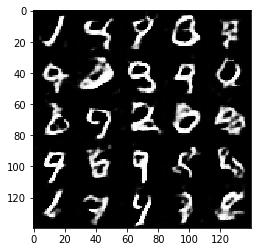

Epoch 1/2... Discriminator Loss: 1.0891... Generator Loss: 0.9379
Epoch 1/2... Discriminator Loss: 1.1718... Generator Loss: 1.5370
Epoch 1/2... Discriminator Loss: 1.0450... Generator Loss: 0.9169
Epoch 1/2... Discriminator Loss: 1.1264... Generator Loss: 0.8184
Epoch 1/2... Discriminator Loss: 1.2260... Generator Loss: 0.6828
Epoch 1/2... Discriminator Loss: 1.0903... Generator Loss: 1.1056
Epoch 1/2... Discriminator Loss: 1.1418... Generator Loss: 1.5530
Epoch 1/2... Discriminator Loss: 1.4458... Generator Loss: 2.2564
Epoch 1/2... Discriminator Loss: 1.0894... Generator Loss: 1.5282
Epoch 1/2... Discriminator Loss: 1.1478... Generator Loss: 1.6817


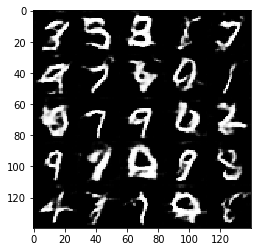

Epoch 1/2... Discriminator Loss: 1.0314... Generator Loss: 1.0352
Epoch 1/2... Discriminator Loss: 1.0673... Generator Loss: 1.3309
Epoch 1/2... Discriminator Loss: 1.2079... Generator Loss: 0.7660
Epoch 1/2... Discriminator Loss: 1.1075... Generator Loss: 1.1151
Epoch 1/2... Discriminator Loss: 1.0953... Generator Loss: 0.9161
Epoch 1/2... Discriminator Loss: 1.1046... Generator Loss: 1.1835
Epoch 1/2... Discriminator Loss: 1.1426... Generator Loss: 0.8618
Epoch 1/2... Discriminator Loss: 1.1699... Generator Loss: 0.7768
Epoch 1/2... Discriminator Loss: 1.2032... Generator Loss: 1.5065
Epoch 1/2... Discriminator Loss: 1.0321... Generator Loss: 1.3649


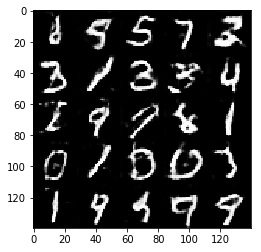

Epoch 1/2... Discriminator Loss: 1.0775... Generator Loss: 1.2412
Epoch 1/2... Discriminator Loss: 1.2732... Generator Loss: 1.8332
Epoch 1/2... Discriminator Loss: 1.1112... Generator Loss: 1.3495
Epoch 1/2... Discriminator Loss: 1.2371... Generator Loss: 1.6857
Epoch 1/2... Discriminator Loss: 1.2085... Generator Loss: 0.7670
Epoch 1/2... Discriminator Loss: 1.1310... Generator Loss: 0.8682
Epoch 1/2... Discriminator Loss: 1.1545... Generator Loss: 0.8227
Epoch 1/2... Discriminator Loss: 1.1414... Generator Loss: 0.9943
Epoch 1/2... Discriminator Loss: 1.0215... Generator Loss: 0.9840
Epoch 1/2... Discriminator Loss: 1.2982... Generator Loss: 1.7048


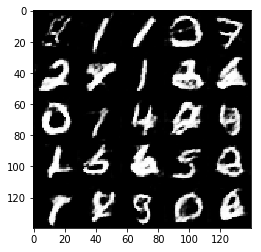

Epoch 1/2... Discriminator Loss: 1.1651... Generator Loss: 1.5211
Epoch 1/2... Discriminator Loss: 1.3003... Generator Loss: 0.6130
Epoch 1/2... Discriminator Loss: 1.1018... Generator Loss: 0.9996
Epoch 1/2... Discriminator Loss: 1.2045... Generator Loss: 1.7810
Epoch 1/2... Discriminator Loss: 1.1705... Generator Loss: 1.0869
Epoch 1/2... Discriminator Loss: 1.1259... Generator Loss: 1.0625
Epoch 1/2... Discriminator Loss: 1.1642... Generator Loss: 1.2806
Epoch 1/2... Discriminator Loss: 1.1401... Generator Loss: 1.1417
Epoch 1/2... Discriminator Loss: 1.4097... Generator Loss: 2.0002
Epoch 1/2... Discriminator Loss: 1.1152... Generator Loss: 0.8630


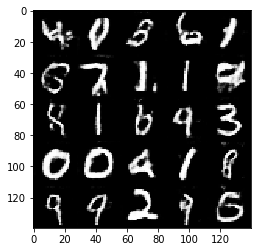

Epoch 1/2... Discriminator Loss: 1.1371... Generator Loss: 0.7586
Epoch 1/2... Discriminator Loss: 1.3316... Generator Loss: 0.5572
Epoch 1/2... Discriminator Loss: 1.1036... Generator Loss: 1.2081
Epoch 1/2... Discriminator Loss: 1.1776... Generator Loss: 0.7989
Epoch 1/2... Discriminator Loss: 1.1264... Generator Loss: 0.9022
Epoch 1/2... Discriminator Loss: 1.1626... Generator Loss: 0.7829
Epoch 1/2... Discriminator Loss: 1.1651... Generator Loss: 1.4088
Epoch 1/2... Discriminator Loss: 1.2268... Generator Loss: 0.6693
Epoch 1/2... Discriminator Loss: 1.2189... Generator Loss: 1.4710
Epoch 1/2... Discriminator Loss: 1.0936... Generator Loss: 1.2941


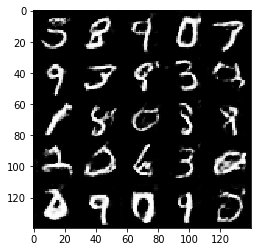

Epoch 1/2... Discriminator Loss: 1.1463... Generator Loss: 0.8110
Epoch 1/2... Discriminator Loss: 1.1129... Generator Loss: 0.9276
Epoch 1/2... Discriminator Loss: 1.1062... Generator Loss: 1.3519
Epoch 2/2... Discriminator Loss: 1.2017... Generator Loss: 0.7214
Epoch 2/2... Discriminator Loss: 1.1350... Generator Loss: 1.4352
Epoch 2/2... Discriminator Loss: 1.0924... Generator Loss: 1.0700
Epoch 2/2... Discriminator Loss: 1.1077... Generator Loss: 1.1446
Epoch 2/2... Discriminator Loss: 1.1726... Generator Loss: 1.4392
Epoch 2/2... Discriminator Loss: 1.1432... Generator Loss: 1.3123
Epoch 2/2... Discriminator Loss: 1.1817... Generator Loss: 0.7865


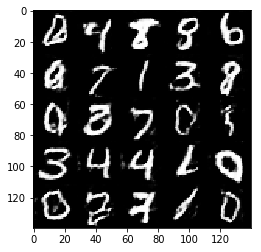

Epoch 2/2... Discriminator Loss: 1.1392... Generator Loss: 1.3782
Epoch 2/2... Discriminator Loss: 1.0837... Generator Loss: 1.1057
Epoch 2/2... Discriminator Loss: 1.1305... Generator Loss: 0.8518
Epoch 2/2... Discriminator Loss: 1.1593... Generator Loss: 1.2473
Epoch 2/2... Discriminator Loss: 1.2267... Generator Loss: 0.7109
Epoch 2/2... Discriminator Loss: 1.0787... Generator Loss: 1.1657
Epoch 2/2... Discriminator Loss: 1.5225... Generator Loss: 0.4522
Epoch 2/2... Discriminator Loss: 1.1059... Generator Loss: 1.0638
Epoch 2/2... Discriminator Loss: 1.0799... Generator Loss: 1.3145
Epoch 2/2... Discriminator Loss: 1.1559... Generator Loss: 0.9793


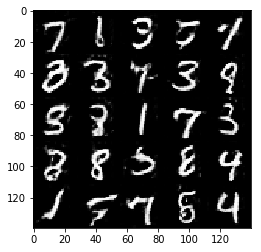

Epoch 2/2... Discriminator Loss: 1.1484... Generator Loss: 0.8205
Epoch 2/2... Discriminator Loss: 1.1336... Generator Loss: 1.1665
Epoch 2/2... Discriminator Loss: 1.1232... Generator Loss: 0.8770
Epoch 2/2... Discriminator Loss: 1.0830... Generator Loss: 1.0535
Epoch 2/2... Discriminator Loss: 1.1533... Generator Loss: 1.3172
Epoch 2/2... Discriminator Loss: 1.1686... Generator Loss: 1.3021
Epoch 2/2... Discriminator Loss: 1.0957... Generator Loss: 1.2060
Epoch 2/2... Discriminator Loss: 1.2195... Generator Loss: 1.5751
Epoch 2/2... Discriminator Loss: 1.1767... Generator Loss: 0.7659
Epoch 2/2... Discriminator Loss: 1.1277... Generator Loss: 1.0429


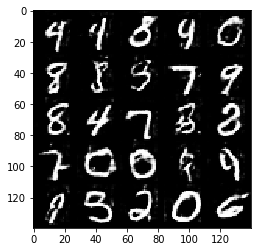

Epoch 2/2... Discriminator Loss: 1.1205... Generator Loss: 1.4073
Epoch 2/2... Discriminator Loss: 1.1496... Generator Loss: 0.9214
Epoch 2/2... Discriminator Loss: 1.1606... Generator Loss: 0.7432
Epoch 2/2... Discriminator Loss: 1.1284... Generator Loss: 0.8542
Epoch 2/2... Discriminator Loss: 1.1296... Generator Loss: 0.8074
Epoch 2/2... Discriminator Loss: 1.0811... Generator Loss: 0.8403
Epoch 2/2... Discriminator Loss: 1.3994... Generator Loss: 0.5043
Epoch 2/2... Discriminator Loss: 1.1727... Generator Loss: 1.0919
Epoch 2/2... Discriminator Loss: 1.0992... Generator Loss: 1.4761
Epoch 2/2... Discriminator Loss: 1.2698... Generator Loss: 1.4762


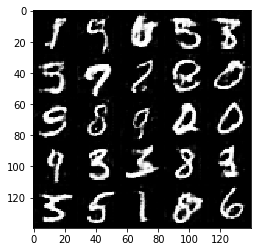

Epoch 2/2... Discriminator Loss: 1.2001... Generator Loss: 1.3296
Epoch 2/2... Discriminator Loss: 1.2330... Generator Loss: 1.5235
Epoch 2/2... Discriminator Loss: 1.1041... Generator Loss: 1.0229
Epoch 2/2... Discriminator Loss: 1.1170... Generator Loss: 1.0772
Epoch 2/2... Discriminator Loss: 1.1625... Generator Loss: 0.8241
Epoch 2/2... Discriminator Loss: 1.1772... Generator Loss: 1.0370
Epoch 2/2... Discriminator Loss: 1.2772... Generator Loss: 0.6526
Epoch 2/2... Discriminator Loss: 1.1226... Generator Loss: 1.0406
Epoch 2/2... Discriminator Loss: 1.1971... Generator Loss: 0.8042
Epoch 2/2... Discriminator Loss: 1.1854... Generator Loss: 0.8437


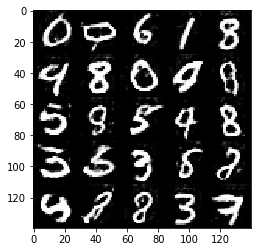

Epoch 2/2... Discriminator Loss: 1.1191... Generator Loss: 0.8773
Epoch 2/2... Discriminator Loss: 1.2215... Generator Loss: 0.9842
Epoch 2/2... Discriminator Loss: 1.1400... Generator Loss: 0.9149
Epoch 2/2... Discriminator Loss: 1.0899... Generator Loss: 1.0939
Epoch 2/2... Discriminator Loss: 1.2434... Generator Loss: 1.4297
Epoch 2/2... Discriminator Loss: 1.1714... Generator Loss: 1.2924
Epoch 2/2... Discriminator Loss: 1.1574... Generator Loss: 1.2730
Epoch 2/2... Discriminator Loss: 1.0690... Generator Loss: 1.1193
Epoch 2/2... Discriminator Loss: 1.3896... Generator Loss: 0.4930
Epoch 2/2... Discriminator Loss: 1.1113... Generator Loss: 1.1107


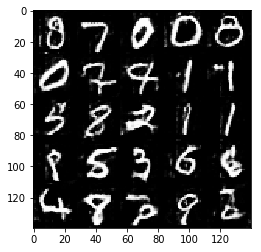

Epoch 2/2... Discriminator Loss: 1.1500... Generator Loss: 0.8805
Epoch 2/2... Discriminator Loss: 1.1643... Generator Loss: 0.8456
Epoch 2/2... Discriminator Loss: 1.1415... Generator Loss: 1.4240
Epoch 2/2... Discriminator Loss: 1.2830... Generator Loss: 0.7223
Epoch 2/2... Discriminator Loss: 1.1534... Generator Loss: 0.8701
Epoch 2/2... Discriminator Loss: 1.1650... Generator Loss: 0.8020
Epoch 2/2... Discriminator Loss: 1.0663... Generator Loss: 1.1816
Epoch 2/2... Discriminator Loss: 1.1322... Generator Loss: 0.8176
Epoch 2/2... Discriminator Loss: 1.1197... Generator Loss: 1.0902
Epoch 2/2... Discriminator Loss: 1.1072... Generator Loss: 1.1180


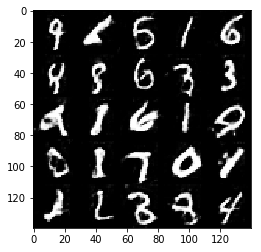

Epoch 2/2... Discriminator Loss: 1.1271... Generator Loss: 0.9585
Epoch 2/2... Discriminator Loss: 1.1653... Generator Loss: 1.0395
Epoch 2/2... Discriminator Loss: 1.1187... Generator Loss: 0.8977
Epoch 2/2... Discriminator Loss: 1.1648... Generator Loss: 1.1346
Epoch 2/2... Discriminator Loss: 1.1112... Generator Loss: 0.8837
Epoch 2/2... Discriminator Loss: 1.1562... Generator Loss: 0.8763
Epoch 2/2... Discriminator Loss: 1.2283... Generator Loss: 1.5414
Epoch 2/2... Discriminator Loss: 1.0552... Generator Loss: 1.2321
Epoch 2/2... Discriminator Loss: 1.1100... Generator Loss: 0.9701
Epoch 2/2... Discriminator Loss: 1.1920... Generator Loss: 1.3809


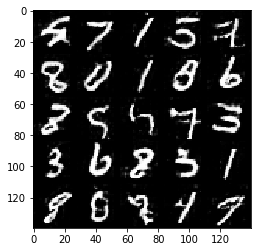

Epoch 2/2... Discriminator Loss: 1.1463... Generator Loss: 1.2069
Epoch 2/2... Discriminator Loss: 1.1527... Generator Loss: 1.0417
Epoch 2/2... Discriminator Loss: 1.3372... Generator Loss: 1.6652
Epoch 2/2... Discriminator Loss: 1.2347... Generator Loss: 0.9010
Epoch 2/2... Discriminator Loss: 1.1623... Generator Loss: 0.9166
Epoch 2/2... Discriminator Loss: 1.0683... Generator Loss: 1.2547
Epoch 2/2... Discriminator Loss: 1.1024... Generator Loss: 0.9005
Epoch 2/2... Discriminator Loss: 1.2176... Generator Loss: 1.2724
Epoch 2/2... Discriminator Loss: 1.2809... Generator Loss: 1.3401
Epoch 2/2... Discriminator Loss: 1.1870... Generator Loss: 0.7678


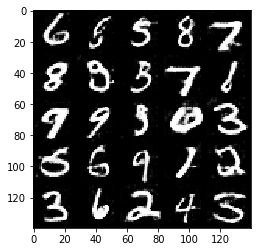

Epoch 2/2... Discriminator Loss: 1.1619... Generator Loss: 0.8355
Epoch 2/2... Discriminator Loss: 1.1498... Generator Loss: 1.0107
Epoch 2/2... Discriminator Loss: 1.1058... Generator Loss: 1.0195
Epoch 2/2... Discriminator Loss: 1.1973... Generator Loss: 0.6807


KeyboardInterrupt: 

In [22]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.5

epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Now let's run our GANs on CelebA.  

Epoch 1/5... Discriminator Loss: 0.7316... Generator Loss: 12.8438
Epoch 1/5... Discriminator Loss: 0.5191... Generator Loss: 2.6138
Epoch 1/5... Discriminator Loss: 0.9703... Generator Loss: 1.3275
Epoch 1/5... Discriminator Loss: 0.9886... Generator Loss: 1.0798
Epoch 1/5... Discriminator Loss: 1.2357... Generator Loss: 1.6587
Epoch 1/5... Discriminator Loss: 1.2019... Generator Loss: 1.3280
Epoch 1/5... Discriminator Loss: 1.2279... Generator Loss: 0.9285
Epoch 1/5... Discriminator Loss: 1.3333... Generator Loss: 0.7822
Epoch 1/5... Discriminator Loss: 1.2899... Generator Loss: 0.9798
Epoch 1/5... Discriminator Loss: 1.3102... Generator Loss: 0.8383


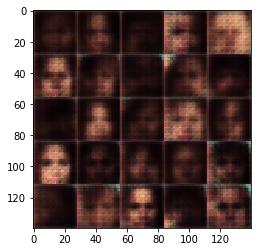

Epoch 1/5... Discriminator Loss: 1.2638... Generator Loss: 1.2617
Epoch 1/5... Discriminator Loss: 1.3300... Generator Loss: 0.9301
Epoch 1/5... Discriminator Loss: 1.3559... Generator Loss: 0.8175
Epoch 1/5... Discriminator Loss: 1.2369... Generator Loss: 0.8328
Epoch 1/5... Discriminator Loss: 1.2377... Generator Loss: 0.9545
Epoch 1/5... Discriminator Loss: 1.3217... Generator Loss: 0.9489
Epoch 1/5... Discriminator Loss: 1.2947... Generator Loss: 1.0027
Epoch 1/5... Discriminator Loss: 1.2705... Generator Loss: 1.0109
Epoch 1/5... Discriminator Loss: 1.3011... Generator Loss: 1.0495
Epoch 1/5... Discriminator Loss: 1.2797... Generator Loss: 0.9227


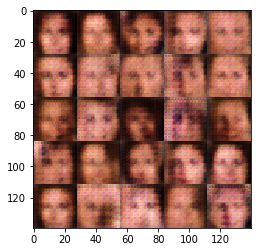

Epoch 1/5... Discriminator Loss: 1.3225... Generator Loss: 1.0929
Epoch 1/5... Discriminator Loss: 1.4574... Generator Loss: 0.6907
Epoch 1/5... Discriminator Loss: 1.3100... Generator Loss: 0.8185
Epoch 1/5... Discriminator Loss: 1.1988... Generator Loss: 1.1898
Epoch 1/5... Discriminator Loss: 1.3549... Generator Loss: 0.9378
Epoch 1/5... Discriminator Loss: 1.2106... Generator Loss: 1.1816
Epoch 1/5... Discriminator Loss: 1.2667... Generator Loss: 0.9313
Epoch 1/5... Discriminator Loss: 1.2183... Generator Loss: 0.7992
Epoch 1/5... Discriminator Loss: 1.2590... Generator Loss: 1.1496
Epoch 1/5... Discriminator Loss: 1.1087... Generator Loss: 1.4714


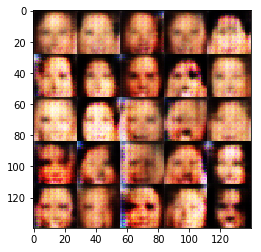

Epoch 1/5... Discriminator Loss: 0.9969... Generator Loss: 0.9578
Epoch 1/5... Discriminator Loss: 1.0147... Generator Loss: 1.0153
Epoch 1/5... Discriminator Loss: 0.8560... Generator Loss: 1.4605
Epoch 1/5... Discriminator Loss: 0.9412... Generator Loss: 1.3506
Epoch 1/5... Discriminator Loss: 1.1759... Generator Loss: 1.5540
Epoch 1/5... Discriminator Loss: 1.3352... Generator Loss: 0.6452
Epoch 1/5... Discriminator Loss: 1.2788... Generator Loss: 1.7446
Epoch 1/5... Discriminator Loss: 1.2175... Generator Loss: 1.0021
Epoch 1/5... Discriminator Loss: 1.1732... Generator Loss: 1.1742
Epoch 1/5... Discriminator Loss: 1.1369... Generator Loss: 0.9420


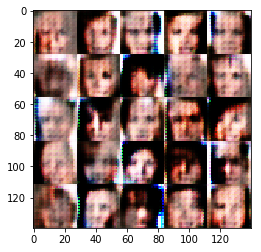

Epoch 1/5... Discriminator Loss: 1.0995... Generator Loss: 1.0641
Epoch 1/5... Discriminator Loss: 1.2144... Generator Loss: 0.9575
Epoch 1/5... Discriminator Loss: 1.3151... Generator Loss: 0.7757
Epoch 1/5... Discriminator Loss: 1.4421... Generator Loss: 1.4441
Epoch 1/5... Discriminator Loss: 1.1895... Generator Loss: 0.9771
Epoch 1/5... Discriminator Loss: 1.3040... Generator Loss: 1.1046
Epoch 1/5... Discriminator Loss: 1.1613... Generator Loss: 0.8831
Epoch 1/5... Discriminator Loss: 1.2632... Generator Loss: 1.3050
Epoch 1/5... Discriminator Loss: 1.1516... Generator Loss: 1.0782
Epoch 1/5... Discriminator Loss: 1.2072... Generator Loss: 0.9510


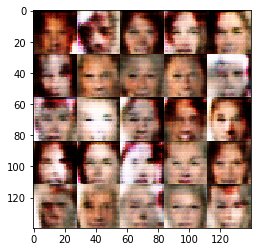

Epoch 1/5... Discriminator Loss: 1.3022... Generator Loss: 1.3006
Epoch 1/5... Discriminator Loss: 1.1827... Generator Loss: 1.1681
Epoch 1/5... Discriminator Loss: 1.2479... Generator Loss: 1.3518
Epoch 1/5... Discriminator Loss: 1.2184... Generator Loss: 1.0391
Epoch 1/5... Discriminator Loss: 0.8828... Generator Loss: 1.2425
Epoch 1/5... Discriminator Loss: 1.2266... Generator Loss: 1.0888
Epoch 1/5... Discriminator Loss: 1.2776... Generator Loss: 0.9207
Epoch 1/5... Discriminator Loss: 1.0779... Generator Loss: 1.0222
Epoch 1/5... Discriminator Loss: 1.2823... Generator Loss: 1.9352
Epoch 1/5... Discriminator Loss: 1.2519... Generator Loss: 1.2025


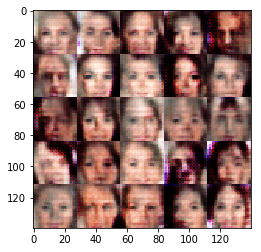

Epoch 1/5... Discriminator Loss: 1.2412... Generator Loss: 0.8559
Epoch 1/5... Discriminator Loss: 1.1383... Generator Loss: 1.0586
Epoch 1/5... Discriminator Loss: 1.3226... Generator Loss: 1.1770
Epoch 1/5... Discriminator Loss: 1.1720... Generator Loss: 0.8985
Epoch 1/5... Discriminator Loss: 1.2097... Generator Loss: 0.9057
Epoch 1/5... Discriminator Loss: 1.2735... Generator Loss: 1.3569
Epoch 1/5... Discriminator Loss: 1.1676... Generator Loss: 0.8847
Epoch 1/5... Discriminator Loss: 1.2193... Generator Loss: 0.8269
Epoch 1/5... Discriminator Loss: 1.1971... Generator Loss: 0.9511
Epoch 1/5... Discriminator Loss: 1.3416... Generator Loss: 1.1784


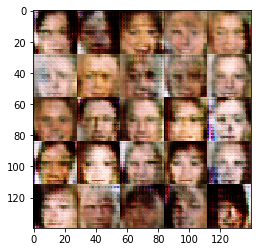

Epoch 1/5... Discriminator Loss: 1.2666... Generator Loss: 0.9584
Epoch 1/5... Discriminator Loss: 1.2326... Generator Loss: 0.7831
Epoch 1/5... Discriminator Loss: 1.2642... Generator Loss: 1.0773
Epoch 1/5... Discriminator Loss: 1.3116... Generator Loss: 0.8913
Epoch 1/5... Discriminator Loss: 1.2573... Generator Loss: 0.9742
Epoch 1/5... Discriminator Loss: 1.2619... Generator Loss: 1.0838
Epoch 1/5... Discriminator Loss: 1.2491... Generator Loss: 0.8310
Epoch 1/5... Discriminator Loss: 1.2318... Generator Loss: 0.9285
Epoch 1/5... Discriminator Loss: 1.3164... Generator Loss: 0.8665
Epoch 1/5... Discriminator Loss: 1.2798... Generator Loss: 0.7988


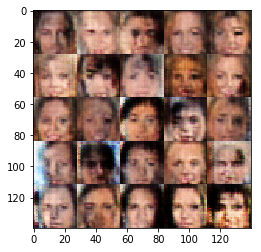

Epoch 1/5... Discriminator Loss: 1.2024... Generator Loss: 0.7215
Epoch 1/5... Discriminator Loss: 1.3225... Generator Loss: 0.7575
Epoch 1/5... Discriminator Loss: 1.2928... Generator Loss: 0.9103
Epoch 1/5... Discriminator Loss: 1.2866... Generator Loss: 0.7791
Epoch 1/5... Discriminator Loss: 1.2788... Generator Loss: 0.9259
Epoch 1/5... Discriminator Loss: 1.2912... Generator Loss: 0.8415
Epoch 1/5... Discriminator Loss: 1.1938... Generator Loss: 1.3355
Epoch 1/5... Discriminator Loss: 1.3099... Generator Loss: 0.9080
Epoch 1/5... Discriminator Loss: 1.3048... Generator Loss: 1.1072
Epoch 1/5... Discriminator Loss: 1.2214... Generator Loss: 0.8758


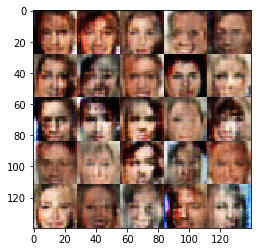

Epoch 1/5... Discriminator Loss: 1.3272... Generator Loss: 0.9757
Epoch 1/5... Discriminator Loss: 1.2808... Generator Loss: 0.7832
Epoch 1/5... Discriminator Loss: 1.3061... Generator Loss: 0.8428
Epoch 1/5... Discriminator Loss: 1.3169... Generator Loss: 1.0239
Epoch 1/5... Discriminator Loss: 1.2780... Generator Loss: 0.9664
Epoch 1/5... Discriminator Loss: 1.2703... Generator Loss: 0.8208
Epoch 1/5... Discriminator Loss: 1.2964... Generator Loss: 0.8021
Epoch 1/5... Discriminator Loss: 1.2554... Generator Loss: 1.0559
Epoch 1/5... Discriminator Loss: 1.2771... Generator Loss: 1.0193
Epoch 1/5... Discriminator Loss: 1.2861... Generator Loss: 0.8534


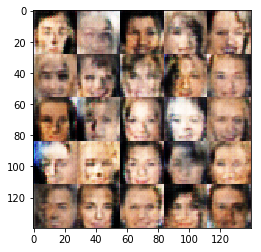

Epoch 1/5... Discriminator Loss: 1.3112... Generator Loss: 0.8853
Epoch 1/5... Discriminator Loss: 1.3527... Generator Loss: 0.9216
Epoch 1/5... Discriminator Loss: 1.3121... Generator Loss: 1.0275
Epoch 1/5... Discriminator Loss: 1.3203... Generator Loss: 0.7900
Epoch 1/5... Discriminator Loss: 1.3340... Generator Loss: 0.7183
Epoch 1/5... Discriminator Loss: 1.2983... Generator Loss: 1.0253
Epoch 1/5... Discriminator Loss: 1.3309... Generator Loss: 0.8019
Epoch 1/5... Discriminator Loss: 1.3256... Generator Loss: 0.8643
Epoch 1/5... Discriminator Loss: 1.3245... Generator Loss: 0.8027
Epoch 1/5... Discriminator Loss: 1.3611... Generator Loss: 1.0702


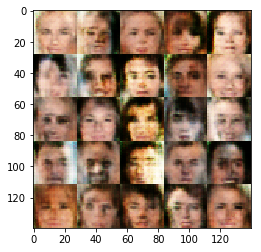

Epoch 1/5... Discriminator Loss: 1.2833... Generator Loss: 1.0839
Epoch 1/5... Discriminator Loss: 1.3954... Generator Loss: 0.9282
Epoch 1/5... Discriminator Loss: 1.2779... Generator Loss: 0.7690
Epoch 1/5... Discriminator Loss: 1.3215... Generator Loss: 0.9317
Epoch 1/5... Discriminator Loss: 1.3082... Generator Loss: 0.9305
Epoch 1/5... Discriminator Loss: 1.3193... Generator Loss: 0.8580
Epoch 1/5... Discriminator Loss: 1.2791... Generator Loss: 0.8551
Epoch 1/5... Discriminator Loss: 1.3154... Generator Loss: 0.8313
Epoch 1/5... Discriminator Loss: 1.3834... Generator Loss: 0.8343
Epoch 1/5... Discriminator Loss: 1.3313... Generator Loss: 0.7425


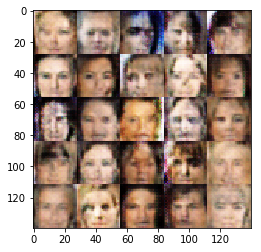

Epoch 1/5... Discriminator Loss: 1.3614... Generator Loss: 0.7493
Epoch 1/5... Discriminator Loss: 1.3009... Generator Loss: 0.7457
Epoch 1/5... Discriminator Loss: 1.3937... Generator Loss: 0.8021
Epoch 1/5... Discriminator Loss: 1.3252... Generator Loss: 1.0209
Epoch 1/5... Discriminator Loss: 1.2604... Generator Loss: 0.8682
Epoch 1/5... Discriminator Loss: 1.2577... Generator Loss: 0.7359
Epoch 1/5... Discriminator Loss: 1.3482... Generator Loss: 0.8098
Epoch 1/5... Discriminator Loss: 1.3464... Generator Loss: 0.8339
Epoch 1/5... Discriminator Loss: 1.2403... Generator Loss: 0.8490
Epoch 1/5... Discriminator Loss: 1.2917... Generator Loss: 0.8028


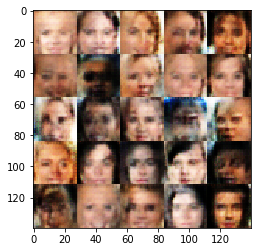

Epoch 1/5... Discriminator Loss: 1.2710... Generator Loss: 1.0486
Epoch 1/5... Discriminator Loss: 1.2827... Generator Loss: 0.7671
Epoch 1/5... Discriminator Loss: 1.3416... Generator Loss: 1.1680
Epoch 1/5... Discriminator Loss: 1.2555... Generator Loss: 0.8408
Epoch 1/5... Discriminator Loss: 1.3146... Generator Loss: 0.9088
Epoch 1/5... Discriminator Loss: 1.3347... Generator Loss: 0.7823
Epoch 1/5... Discriminator Loss: 1.3234... Generator Loss: 0.9840
Epoch 1/5... Discriminator Loss: 1.3162... Generator Loss: 0.8279
Epoch 1/5... Discriminator Loss: 1.2933... Generator Loss: 0.8596
Epoch 1/5... Discriminator Loss: 1.2946... Generator Loss: 0.8754


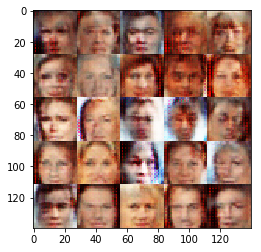

Epoch 1/5... Discriminator Loss: 1.3111... Generator Loss: 0.7729
Epoch 1/5... Discriminator Loss: 1.3207... Generator Loss: 0.9211
Epoch 1/5... Discriminator Loss: 1.2997... Generator Loss: 0.7412
Epoch 1/5... Discriminator Loss: 1.3259... Generator Loss: 0.7850
Epoch 1/5... Discriminator Loss: 1.3283... Generator Loss: 0.9783
Epoch 1/5... Discriminator Loss: 1.2804... Generator Loss: 0.8345
Epoch 1/5... Discriminator Loss: 1.3172... Generator Loss: 0.9612
Epoch 1/5... Discriminator Loss: 1.3220... Generator Loss: 0.9016
Epoch 1/5... Discriminator Loss: 1.3463... Generator Loss: 0.8871
Epoch 1/5... Discriminator Loss: 1.3021... Generator Loss: 0.8413


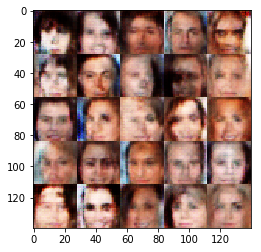

Epoch 1/5... Discriminator Loss: 1.2787... Generator Loss: 0.9610
Epoch 1/5... Discriminator Loss: 1.2791... Generator Loss: 0.8880
Epoch 1/5... Discriminator Loss: 1.2944... Generator Loss: 0.9428
Epoch 1/5... Discriminator Loss: 1.3231... Generator Loss: 0.9102
Epoch 1/5... Discriminator Loss: 1.2648... Generator Loss: 0.7394
Epoch 1/5... Discriminator Loss: 1.3205... Generator Loss: 0.9533
Epoch 1/5... Discriminator Loss: 1.3495... Generator Loss: 0.9201
Epoch 1/5... Discriminator Loss: 1.3314... Generator Loss: 0.9942
Epoch 1/5... Discriminator Loss: 1.2947... Generator Loss: 0.8942
Epoch 1/5... Discriminator Loss: 1.2498... Generator Loss: 0.8154


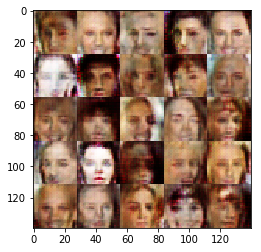

Epoch 1/5... Discriminator Loss: 1.2837... Generator Loss: 0.8882
Epoch 1/5... Discriminator Loss: 1.2933... Generator Loss: 0.9082
Epoch 1/5... Discriminator Loss: 1.3121... Generator Loss: 0.9468
Epoch 1/5... Discriminator Loss: 1.3413... Generator Loss: 0.8021
Epoch 1/5... Discriminator Loss: 1.2858... Generator Loss: 0.9051
Epoch 1/5... Discriminator Loss: 1.2532... Generator Loss: 0.8503
Epoch 1/5... Discriminator Loss: 1.2633... Generator Loss: 0.7631
Epoch 1/5... Discriminator Loss: 1.2833... Generator Loss: 0.9629
Epoch 1/5... Discriminator Loss: 1.2280... Generator Loss: 0.8990
Epoch 1/5... Discriminator Loss: 1.3351... Generator Loss: 0.8694


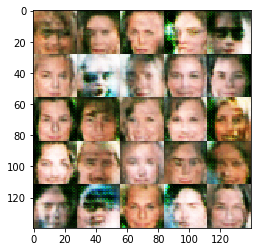

Epoch 1/5... Discriminator Loss: 1.3188... Generator Loss: 0.9480
Epoch 1/5... Discriminator Loss: 1.2574... Generator Loss: 0.8889
Epoch 1/5... Discriminator Loss: 1.3016... Generator Loss: 0.9484
Epoch 1/5... Discriminator Loss: 1.3154... Generator Loss: 0.8320
Epoch 1/5... Discriminator Loss: 1.3465... Generator Loss: 0.9067
Epoch 1/5... Discriminator Loss: 1.2903... Generator Loss: 0.9155
Epoch 1/5... Discriminator Loss: 1.2837... Generator Loss: 0.8976
Epoch 1/5... Discriminator Loss: 1.2780... Generator Loss: 0.9865
Epoch 1/5... Discriminator Loss: 1.3185... Generator Loss: 0.8802
Epoch 1/5... Discriminator Loss: 1.3036... Generator Loss: 0.9482


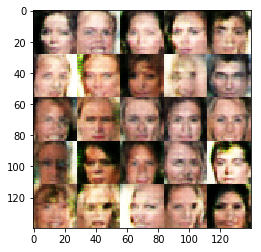

Epoch 1/5... Discriminator Loss: 1.2932... Generator Loss: 0.9083
Epoch 1/5... Discriminator Loss: 1.3029... Generator Loss: 0.8303
Epoch 1/5... Discriminator Loss: 1.2804... Generator Loss: 0.8638
Epoch 1/5... Discriminator Loss: 1.3319... Generator Loss: 0.8692
Epoch 1/5... Discriminator Loss: 1.3076... Generator Loss: 1.0169
Epoch 1/5... Discriminator Loss: 1.2616... Generator Loss: 0.8075
Epoch 1/5... Discriminator Loss: 1.3107... Generator Loss: 0.8445
Epoch 1/5... Discriminator Loss: 1.2937... Generator Loss: 0.8215
Epoch 1/5... Discriminator Loss: 1.3108... Generator Loss: 0.8125
Epoch 1/5... Discriminator Loss: 1.3146... Generator Loss: 0.7469


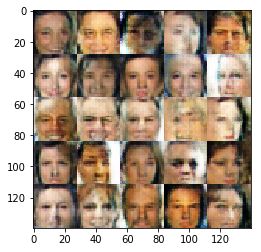

Epoch 1/5... Discriminator Loss: 1.3185... Generator Loss: 0.8411
Epoch 1/5... Discriminator Loss: 1.3109... Generator Loss: 0.8933
Epoch 1/5... Discriminator Loss: 1.3487... Generator Loss: 0.9044
Epoch 1/5... Discriminator Loss: 1.3356... Generator Loss: 0.9268
Epoch 1/5... Discriminator Loss: 1.3495... Generator Loss: 0.9523
Epoch 1/5... Discriminator Loss: 1.3148... Generator Loss: 1.0076
Epoch 1/5... Discriminator Loss: 1.3045... Generator Loss: 0.8765
Epoch 1/5... Discriminator Loss: 1.3038... Generator Loss: 0.8694
Epoch 1/5... Discriminator Loss: 1.3253... Generator Loss: 0.8175
Epoch 1/5... Discriminator Loss: 1.2568... Generator Loss: 0.8269


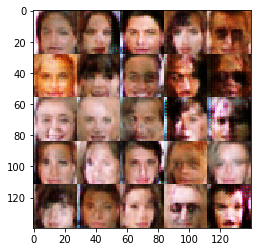

Epoch 1/5... Discriminator Loss: 1.2551... Generator Loss: 1.0206
Epoch 1/5... Discriminator Loss: 1.3811... Generator Loss: 0.9122
Epoch 1/5... Discriminator Loss: 1.3352... Generator Loss: 0.7828
Epoch 1/5... Discriminator Loss: 1.2960... Generator Loss: 0.8655
Epoch 1/5... Discriminator Loss: 1.3231... Generator Loss: 0.9146
Epoch 1/5... Discriminator Loss: 1.3405... Generator Loss: 0.9446
Epoch 1/5... Discriminator Loss: 1.3026... Generator Loss: 0.8092
Epoch 1/5... Discriminator Loss: 1.3067... Generator Loss: 0.8131
Epoch 1/5... Discriminator Loss: 1.2985... Generator Loss: 0.8938
Epoch 1/5... Discriminator Loss: 1.3106... Generator Loss: 0.9493


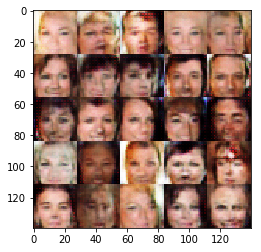

Epoch 1/5... Discriminator Loss: 1.3457... Generator Loss: 0.9863
Epoch 1/5... Discriminator Loss: 1.2243... Generator Loss: 0.9406
Epoch 1/5... Discriminator Loss: 1.2809... Generator Loss: 0.7643
Epoch 1/5... Discriminator Loss: 1.2987... Generator Loss: 0.8177
Epoch 1/5... Discriminator Loss: 1.3449... Generator Loss: 0.8005
Epoch 1/5... Discriminator Loss: 1.3331... Generator Loss: 0.8769
Epoch 1/5... Discriminator Loss: 1.3254... Generator Loss: 0.8537
Epoch 1/5... Discriminator Loss: 1.2992... Generator Loss: 0.9890
Epoch 1/5... Discriminator Loss: 1.2647... Generator Loss: 0.8766
Epoch 1/5... Discriminator Loss: 1.3452... Generator Loss: 0.8384


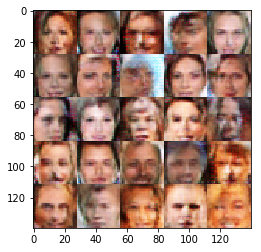

Epoch 1/5... Discriminator Loss: 1.3263... Generator Loss: 0.8624
Epoch 1/5... Discriminator Loss: 1.3238... Generator Loss: 0.8710
Epoch 1/5... Discriminator Loss: 1.3088... Generator Loss: 0.8820
Epoch 1/5... Discriminator Loss: 1.3055... Generator Loss: 0.9742
Epoch 1/5... Discriminator Loss: 1.2431... Generator Loss: 0.8514
Epoch 1/5... Discriminator Loss: 1.3659... Generator Loss: 0.7899
Epoch 1/5... Discriminator Loss: 1.3309... Generator Loss: 0.9254
Epoch 1/5... Discriminator Loss: 1.2879... Generator Loss: 0.9480
Epoch 1/5... Discriminator Loss: 1.3121... Generator Loss: 0.8613
Epoch 1/5... Discriminator Loss: 1.3192... Generator Loss: 0.9147


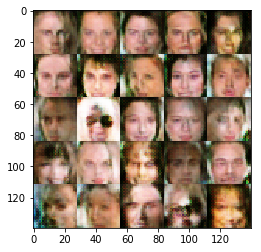

Epoch 1/5... Discriminator Loss: 1.3056... Generator Loss: 0.9087
Epoch 1/5... Discriminator Loss: 1.3022... Generator Loss: 0.8865
Epoch 1/5... Discriminator Loss: 1.3219... Generator Loss: 0.8632
Epoch 1/5... Discriminator Loss: 1.3094... Generator Loss: 0.9118
Epoch 1/5... Discriminator Loss: 1.3265... Generator Loss: 0.9204
Epoch 1/5... Discriminator Loss: 1.3281... Generator Loss: 0.8455
Epoch 1/5... Discriminator Loss: 1.3048... Generator Loss: 0.9962
Epoch 1/5... Discriminator Loss: 1.3106... Generator Loss: 0.8420
Epoch 1/5... Discriminator Loss: 1.3151... Generator Loss: 0.7938
Epoch 1/5... Discriminator Loss: 1.2631... Generator Loss: 0.7697


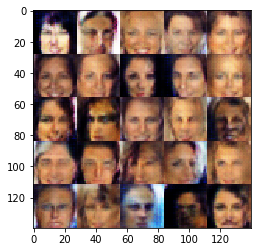

Epoch 1/5... Discriminator Loss: 1.3616... Generator Loss: 0.7848
Epoch 1/5... Discriminator Loss: 1.3211... Generator Loss: 0.9469
Epoch 1/5... Discriminator Loss: 1.3412... Generator Loss: 0.8523
Epoch 1/5... Discriminator Loss: 1.2945... Generator Loss: 0.7977
Epoch 1/5... Discriminator Loss: 1.2760... Generator Loss: 0.8740
Epoch 1/5... Discriminator Loss: 1.3421... Generator Loss: 0.8478
Epoch 1/5... Discriminator Loss: 1.2924... Generator Loss: 0.8376
Epoch 1/5... Discriminator Loss: 1.3443... Generator Loss: 0.8712
Epoch 1/5... Discriminator Loss: 1.2981... Generator Loss: 0.8428
Epoch 1/5... Discriminator Loss: 1.3272... Generator Loss: 0.9280


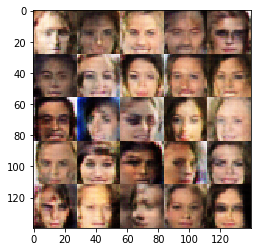

Epoch 1/5... Discriminator Loss: 1.3127... Generator Loss: 0.8592
Epoch 1/5... Discriminator Loss: 1.3272... Generator Loss: 0.8588
Epoch 1/5... Discriminator Loss: 1.2790... Generator Loss: 0.9438
Epoch 1/5... Discriminator Loss: 1.2176... Generator Loss: 0.8623
Epoch 1/5... Discriminator Loss: 1.3459... Generator Loss: 0.8162
Epoch 1/5... Discriminator Loss: 1.3257... Generator Loss: 0.9417
Epoch 1/5... Discriminator Loss: 1.3315... Generator Loss: 0.8545
Epoch 1/5... Discriminator Loss: 1.3086... Generator Loss: 0.8880
Epoch 1/5... Discriminator Loss: 1.3114... Generator Loss: 0.7944
Epoch 1/5... Discriminator Loss: 1.3267... Generator Loss: 0.8350


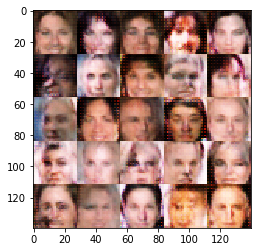

Epoch 1/5... Discriminator Loss: 1.3309... Generator Loss: 0.8164
Epoch 1/5... Discriminator Loss: 1.3655... Generator Loss: 0.9122
Epoch 1/5... Discriminator Loss: 1.3292... Generator Loss: 0.8749
Epoch 1/5... Discriminator Loss: 1.3378... Generator Loss: 0.9054
Epoch 1/5... Discriminator Loss: 1.3654... Generator Loss: 0.7757
Epoch 1/5... Discriminator Loss: 1.3190... Generator Loss: 0.9361
Epoch 1/5... Discriminator Loss: 1.2719... Generator Loss: 0.8596
Epoch 1/5... Discriminator Loss: 1.2960... Generator Loss: 0.8880
Epoch 1/5... Discriminator Loss: 1.3487... Generator Loss: 0.8314
Epoch 1/5... Discriminator Loss: 1.3539... Generator Loss: 0.7945


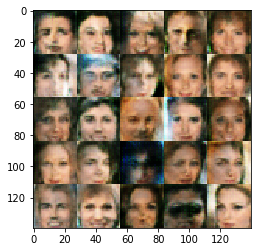

Epoch 1/5... Discriminator Loss: 1.3286... Generator Loss: 0.8409
Epoch 1/5... Discriminator Loss: 1.3186... Generator Loss: 0.8874
Epoch 1/5... Discriminator Loss: 1.3037... Generator Loss: 0.8433
Epoch 1/5... Discriminator Loss: 1.3322... Generator Loss: 0.9092
Epoch 1/5... Discriminator Loss: 1.3114... Generator Loss: 0.8847
Epoch 1/5... Discriminator Loss: 1.3006... Generator Loss: 0.8895
Epoch 1/5... Discriminator Loss: 1.3406... Generator Loss: 0.8402
Epoch 1/5... Discriminator Loss: 1.3176... Generator Loss: 0.8820
Epoch 1/5... Discriminator Loss: 1.3165... Generator Loss: 0.8533
Epoch 1/5... Discriminator Loss: 1.3133... Generator Loss: 0.8472


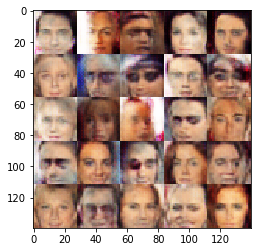

Epoch 1/5... Discriminator Loss: 1.3025... Generator Loss: 0.9389
Epoch 1/5... Discriminator Loss: 1.2463... Generator Loss: 0.8474
Epoch 1/5... Discriminator Loss: 1.2718... Generator Loss: 0.8867
Epoch 1/5... Discriminator Loss: 1.3296... Generator Loss: 0.9518
Epoch 1/5... Discriminator Loss: 1.3115... Generator Loss: 0.9486
Epoch 1/5... Discriminator Loss: 1.3431... Generator Loss: 0.8111
Epoch 1/5... Discriminator Loss: 1.3180... Generator Loss: 0.8165
Epoch 1/5... Discriminator Loss: 1.3440... Generator Loss: 0.7747
Epoch 1/5... Discriminator Loss: 1.3150... Generator Loss: 0.8480
Epoch 1/5... Discriminator Loss: 1.2989... Generator Loss: 0.9041


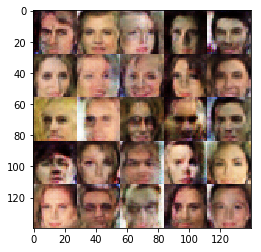

Epoch 1/5... Discriminator Loss: 1.3295... Generator Loss: 0.8069
Epoch 1/5... Discriminator Loss: 1.3168... Generator Loss: 0.8541
Epoch 1/5... Discriminator Loss: 1.2943... Generator Loss: 0.8549
Epoch 1/5... Discriminator Loss: 1.2630... Generator Loss: 0.8547
Epoch 1/5... Discriminator Loss: 1.3040... Generator Loss: 0.8464
Epoch 1/5... Discriminator Loss: 1.3160... Generator Loss: 0.9276
Epoch 1/5... Discriminator Loss: 1.3432... Generator Loss: 0.8121
Epoch 1/5... Discriminator Loss: 1.3424... Generator Loss: 0.8060
Epoch 1/5... Discriminator Loss: 1.3336... Generator Loss: 0.8505
Epoch 1/5... Discriminator Loss: 1.3321... Generator Loss: 0.8658


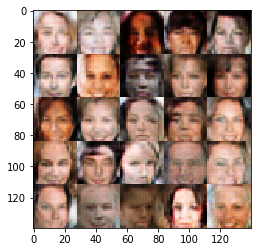

Epoch 1/5... Discriminator Loss: 1.3196... Generator Loss: 0.8108
Epoch 1/5... Discriminator Loss: 1.2792... Generator Loss: 0.7887
Epoch 1/5... Discriminator Loss: 1.3146... Generator Loss: 0.8864
Epoch 1/5... Discriminator Loss: 1.3301... Generator Loss: 0.8783
Epoch 1/5... Discriminator Loss: 1.3382... Generator Loss: 0.8677
Epoch 1/5... Discriminator Loss: 1.3117... Generator Loss: 0.8253
Epoch 1/5... Discriminator Loss: 1.3519... Generator Loss: 0.9083
Epoch 1/5... Discriminator Loss: 1.3134... Generator Loss: 0.9360
Epoch 1/5... Discriminator Loss: 1.3232... Generator Loss: 0.8491
Epoch 1/5... Discriminator Loss: 1.3152... Generator Loss: 0.7732


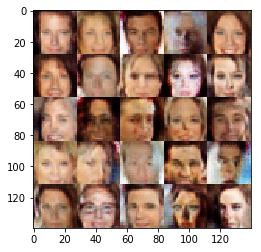

Epoch 1/5... Discriminator Loss: 1.3423... Generator Loss: 0.8361
Epoch 1/5... Discriminator Loss: 1.3194... Generator Loss: 0.8308
Epoch 1/5... Discriminator Loss: 1.3148... Generator Loss: 0.8669
Epoch 1/5... Discriminator Loss: 1.3400... Generator Loss: 0.8570
Epoch 1/5... Discriminator Loss: 1.3588... Generator Loss: 0.8883
Epoch 1/5... Discriminator Loss: 1.3247... Generator Loss: 0.8565
Epoch 2/5... Discriminator Loss: 1.3282... Generator Loss: 0.8341
Epoch 2/5... Discriminator Loss: 1.3494... Generator Loss: 0.8045
Epoch 2/5... Discriminator Loss: 1.3563... Generator Loss: 0.9018
Epoch 2/5... Discriminator Loss: 1.3435... Generator Loss: 0.8232


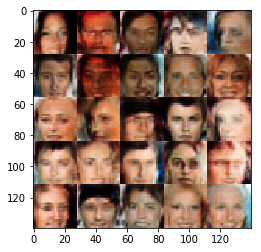

Epoch 2/5... Discriminator Loss: 1.3623... Generator Loss: 0.8076
Epoch 2/5... Discriminator Loss: 1.3364... Generator Loss: 0.8699
Epoch 2/5... Discriminator Loss: 1.3705... Generator Loss: 0.7867
Epoch 2/5... Discriminator Loss: 1.3403... Generator Loss: 0.9128
Epoch 2/5... Discriminator Loss: 1.3610... Generator Loss: 0.8169
Epoch 2/5... Discriminator Loss: 1.3412... Generator Loss: 0.9058
Epoch 2/5... Discriminator Loss: 1.3267... Generator Loss: 0.8653
Epoch 2/5... Discriminator Loss: 1.2987... Generator Loss: 0.8655
Epoch 2/5... Discriminator Loss: 1.3121... Generator Loss: 0.8923
Epoch 2/5... Discriminator Loss: 1.3376... Generator Loss: 0.9020


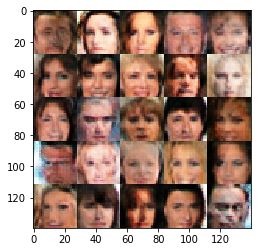

Epoch 2/5... Discriminator Loss: 1.3052... Generator Loss: 0.8003
Epoch 2/5... Discriminator Loss: 1.3394... Generator Loss: 0.7779
Epoch 2/5... Discriminator Loss: 1.3301... Generator Loss: 0.8386
Epoch 2/5... Discriminator Loss: 1.3508... Generator Loss: 0.8686
Epoch 2/5... Discriminator Loss: 1.3396... Generator Loss: 0.8679
Epoch 2/5... Discriminator Loss: 1.3063... Generator Loss: 0.8480
Epoch 2/5... Discriminator Loss: 1.3338... Generator Loss: 0.8186
Epoch 2/5... Discriminator Loss: 1.3509... Generator Loss: 0.8697
Epoch 2/5... Discriminator Loss: 1.3435... Generator Loss: 0.8260
Epoch 2/5... Discriminator Loss: 1.3739... Generator Loss: 0.8217


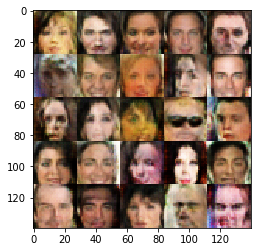

Epoch 2/5... Discriminator Loss: 1.3613... Generator Loss: 0.8284
Epoch 2/5... Discriminator Loss: 1.3457... Generator Loss: 0.8335
Epoch 2/5... Discriminator Loss: 1.3316... Generator Loss: 0.8864
Epoch 2/5... Discriminator Loss: 1.3428... Generator Loss: 0.7955
Epoch 2/5... Discriminator Loss: 1.3417... Generator Loss: 0.8606
Epoch 2/5... Discriminator Loss: 1.3396... Generator Loss: 0.8119
Epoch 2/5... Discriminator Loss: 1.3417... Generator Loss: 0.8376
Epoch 2/5... Discriminator Loss: 1.3182... Generator Loss: 0.8180
Epoch 2/5... Discriminator Loss: 1.3395... Generator Loss: 0.8186
Epoch 2/5... Discriminator Loss: 1.3507... Generator Loss: 0.8522


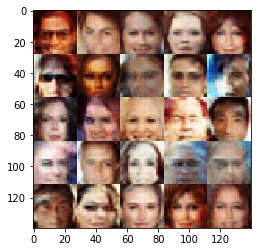

Epoch 2/5... Discriminator Loss: 1.3494... Generator Loss: 0.8347
Epoch 2/5... Discriminator Loss: 1.3496... Generator Loss: 0.8504
Epoch 2/5... Discriminator Loss: 1.3262... Generator Loss: 0.8540
Epoch 2/5... Discriminator Loss: 1.3420... Generator Loss: 0.8586
Epoch 2/5... Discriminator Loss: 1.3514... Generator Loss: 0.8409
Epoch 2/5... Discriminator Loss: 1.3520... Generator Loss: 0.8032
Epoch 2/5... Discriminator Loss: 1.3259... Generator Loss: 0.7836
Epoch 2/5... Discriminator Loss: 1.3096... Generator Loss: 0.8002
Epoch 2/5... Discriminator Loss: 1.3674... Generator Loss: 0.8358
Epoch 2/5... Discriminator Loss: 1.3238... Generator Loss: 0.8220


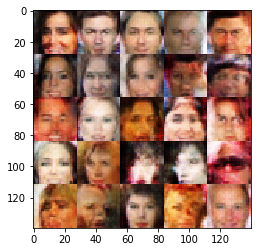

Epoch 2/5... Discriminator Loss: 1.3674... Generator Loss: 0.8119
Epoch 2/5... Discriminator Loss: 1.3512... Generator Loss: 0.8227
Epoch 2/5... Discriminator Loss: 1.3501... Generator Loss: 0.8066
Epoch 2/5... Discriminator Loss: 1.3392... Generator Loss: 0.8446
Epoch 2/5... Discriminator Loss: 1.3395... Generator Loss: 0.7965
Epoch 2/5... Discriminator Loss: 1.3358... Generator Loss: 0.8445
Epoch 2/5... Discriminator Loss: 1.3483... Generator Loss: 0.8387
Epoch 2/5... Discriminator Loss: 1.3691... Generator Loss: 0.8250
Epoch 2/5... Discriminator Loss: 1.3601... Generator Loss: 0.7821
Epoch 2/5... Discriminator Loss: 1.3656... Generator Loss: 0.8341


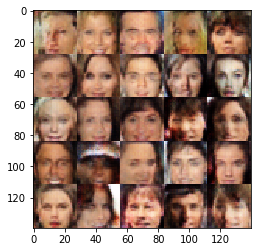

Epoch 2/5... Discriminator Loss: 1.3499... Generator Loss: 0.8558
Epoch 2/5... Discriminator Loss: 1.3422... Generator Loss: 0.8430
Epoch 2/5... Discriminator Loss: 1.3451... Generator Loss: 0.7933
Epoch 2/5... Discriminator Loss: 1.3253... Generator Loss: 0.8061
Epoch 2/5... Discriminator Loss: 1.3475... Generator Loss: 0.8163
Epoch 2/5... Discriminator Loss: 1.3392... Generator Loss: 0.8219
Epoch 2/5... Discriminator Loss: 1.3543... Generator Loss: 0.8150
Epoch 2/5... Discriminator Loss: 1.3223... Generator Loss: 0.8639
Epoch 2/5... Discriminator Loss: 1.3572... Generator Loss: 0.8225
Epoch 2/5... Discriminator Loss: 1.3523... Generator Loss: 0.8110


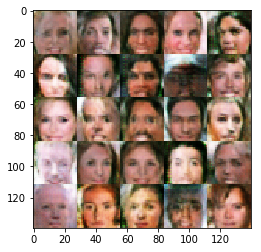

Epoch 2/5... Discriminator Loss: 1.3514... Generator Loss: 0.8256
Epoch 2/5... Discriminator Loss: 1.3495... Generator Loss: 0.8257
Epoch 2/5... Discriminator Loss: 1.3391... Generator Loss: 0.8189
Epoch 2/5... Discriminator Loss: 1.3438... Generator Loss: 0.8296
Epoch 2/5... Discriminator Loss: 1.3296... Generator Loss: 0.8136
Epoch 2/5... Discriminator Loss: 1.3421... Generator Loss: 0.8195
Epoch 2/5... Discriminator Loss: 1.3554... Generator Loss: 0.7880
Epoch 2/5... Discriminator Loss: 1.3661... Generator Loss: 0.8144
Epoch 2/5... Discriminator Loss: 1.3405... Generator Loss: 0.8359
Epoch 2/5... Discriminator Loss: 1.3639... Generator Loss: 0.8377


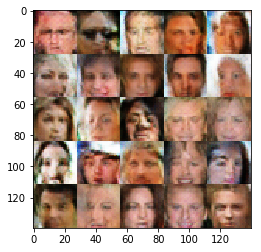

Epoch 2/5... Discriminator Loss: 1.3319... Generator Loss: 0.7928
Epoch 2/5... Discriminator Loss: 1.3430... Generator Loss: 0.8880
Epoch 2/5... Discriminator Loss: 1.3316... Generator Loss: 0.8152
Epoch 2/5... Discriminator Loss: 1.3541... Generator Loss: 0.8405
Epoch 2/5... Discriminator Loss: 1.3460... Generator Loss: 0.8681
Epoch 2/5... Discriminator Loss: 1.3295... Generator Loss: 0.8302
Epoch 2/5... Discriminator Loss: 1.3103... Generator Loss: 0.8040
Epoch 2/5... Discriminator Loss: 1.3621... Generator Loss: 0.8635
Epoch 2/5... Discriminator Loss: 1.3706... Generator Loss: 0.8915
Epoch 2/5... Discriminator Loss: 1.3554... Generator Loss: 0.8239


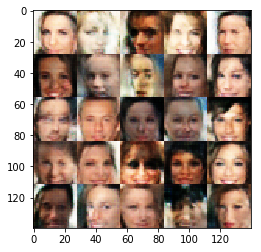

Epoch 2/5... Discriminator Loss: 1.3501... Generator Loss: 0.8033
Epoch 2/5... Discriminator Loss: 1.3512... Generator Loss: 0.8138
Epoch 2/5... Discriminator Loss: 1.3374... Generator Loss: 0.8380
Epoch 2/5... Discriminator Loss: 1.3106... Generator Loss: 0.8168
Epoch 2/5... Discriminator Loss: 1.3696... Generator Loss: 0.8041
Epoch 2/5... Discriminator Loss: 1.3250... Generator Loss: 0.8295
Epoch 2/5... Discriminator Loss: 1.2897... Generator Loss: 0.7745
Epoch 2/5... Discriminator Loss: 1.3281... Generator Loss: 0.9182
Epoch 2/5... Discriminator Loss: 1.3511... Generator Loss: 0.8192
Epoch 2/5... Discriminator Loss: 1.3559... Generator Loss: 0.8542


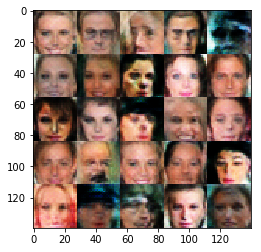

Epoch 2/5... Discriminator Loss: 1.3550... Generator Loss: 0.8227
Epoch 2/5... Discriminator Loss: 1.3440... Generator Loss: 0.8616
Epoch 2/5... Discriminator Loss: 1.3256... Generator Loss: 0.8351
Epoch 2/5... Discriminator Loss: 1.3607... Generator Loss: 0.7993
Epoch 2/5... Discriminator Loss: 1.3520... Generator Loss: 0.8528
Epoch 2/5... Discriminator Loss: 1.3616... Generator Loss: 0.8431
Epoch 2/5... Discriminator Loss: 1.3587... Generator Loss: 0.8230
Epoch 2/5... Discriminator Loss: 1.3552... Generator Loss: 0.8047
Epoch 2/5... Discriminator Loss: 1.3585... Generator Loss: 0.8250
Epoch 2/5... Discriminator Loss: 1.3432... Generator Loss: 0.8051


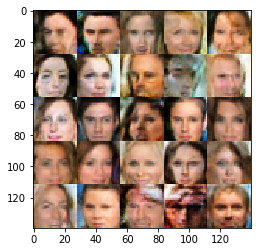

Epoch 2/5... Discriminator Loss: 1.3546... Generator Loss: 0.8312
Epoch 2/5... Discriminator Loss: 1.3374... Generator Loss: 0.8375
Epoch 2/5... Discriminator Loss: 1.3453... Generator Loss: 0.8465
Epoch 2/5... Discriminator Loss: 1.3599... Generator Loss: 0.7926
Epoch 2/5... Discriminator Loss: 1.3658... Generator Loss: 0.8098
Epoch 2/5... Discriminator Loss: 1.3516... Generator Loss: 0.8263
Epoch 2/5... Discriminator Loss: 1.3603... Generator Loss: 0.8292
Epoch 2/5... Discriminator Loss: 1.3289... Generator Loss: 0.8358
Epoch 2/5... Discriminator Loss: 1.3499... Generator Loss: 0.8178
Epoch 2/5... Discriminator Loss: 1.3537... Generator Loss: 0.8235


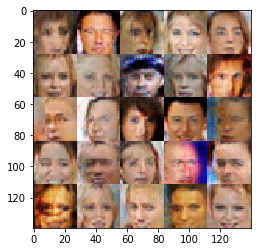

Epoch 2/5... Discriminator Loss: 1.3370... Generator Loss: 0.7991
Epoch 2/5... Discriminator Loss: 1.3716... Generator Loss: 0.8143
Epoch 2/5... Discriminator Loss: 1.3608... Generator Loss: 0.8217
Epoch 2/5... Discriminator Loss: 1.3500... Generator Loss: 0.8187
Epoch 2/5... Discriminator Loss: 1.3627... Generator Loss: 0.8116
Epoch 2/5... Discriminator Loss: 1.3678... Generator Loss: 0.8694
Epoch 2/5... Discriminator Loss: 1.3511... Generator Loss: 0.8208
Epoch 2/5... Discriminator Loss: 1.3450... Generator Loss: 0.8170
Epoch 2/5... Discriminator Loss: 1.3479... Generator Loss: 0.8377
Epoch 2/5... Discriminator Loss: 1.3181... Generator Loss: 0.8070


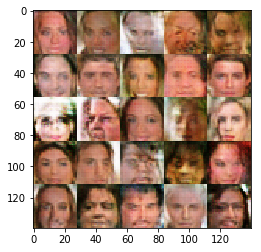

Epoch 2/5... Discriminator Loss: 1.3363... Generator Loss: 0.8214
Epoch 2/5... Discriminator Loss: 1.3550... Generator Loss: 0.8545
Epoch 2/5... Discriminator Loss: 1.3664... Generator Loss: 0.8080
Epoch 2/5... Discriminator Loss: 1.3583... Generator Loss: 0.8147
Epoch 2/5... Discriminator Loss: 1.3562... Generator Loss: 0.8183
Epoch 2/5... Discriminator Loss: 1.3368... Generator Loss: 0.8065
Epoch 2/5... Discriminator Loss: 1.3556... Generator Loss: 0.8348
Epoch 2/5... Discriminator Loss: 1.3605... Generator Loss: 0.8548
Epoch 2/5... Discriminator Loss: 1.3507... Generator Loss: 0.8234
Epoch 2/5... Discriminator Loss: 1.3559... Generator Loss: 0.7955


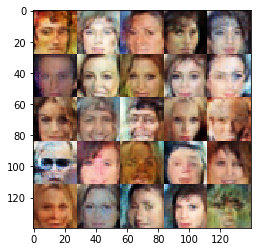

Epoch 2/5... Discriminator Loss: 1.3523... Generator Loss: 0.8141
Epoch 2/5... Discriminator Loss: 1.3334... Generator Loss: 0.8481
Epoch 2/5... Discriminator Loss: 1.3497... Generator Loss: 0.7982
Epoch 2/5... Discriminator Loss: 1.3569... Generator Loss: 0.8085
Epoch 2/5... Discriminator Loss: 1.3412... Generator Loss: 0.8046
Epoch 2/5... Discriminator Loss: 1.3528... Generator Loss: 0.8417
Epoch 2/5... Discriminator Loss: 1.3627... Generator Loss: 0.8181
Epoch 2/5... Discriminator Loss: 1.3357... Generator Loss: 0.8219
Epoch 2/5... Discriminator Loss: 1.3538... Generator Loss: 0.8295
Epoch 2/5... Discriminator Loss: 1.3502... Generator Loss: 0.8153


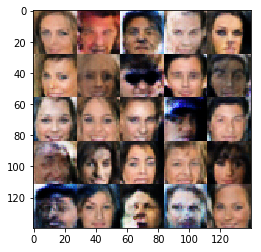

Epoch 2/5... Discriminator Loss: 1.3667... Generator Loss: 0.7967
Epoch 2/5... Discriminator Loss: 1.3552... Generator Loss: 0.8414
Epoch 2/5... Discriminator Loss: 1.3629... Generator Loss: 0.8345
Epoch 2/5... Discriminator Loss: 1.3564... Generator Loss: 0.8118
Epoch 2/5... Discriminator Loss: 1.3620... Generator Loss: 0.8659
Epoch 2/5... Discriminator Loss: 1.3562... Generator Loss: 0.8133
Epoch 2/5... Discriminator Loss: 1.3464... Generator Loss: 0.8191
Epoch 2/5... Discriminator Loss: 1.3352... Generator Loss: 0.8302
Epoch 2/5... Discriminator Loss: 1.3732... Generator Loss: 0.8310
Epoch 2/5... Discriminator Loss: 1.3615... Generator Loss: 0.7925


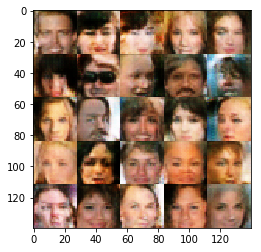

Epoch 2/5... Discriminator Loss: 1.3565... Generator Loss: 0.8376
Epoch 2/5... Discriminator Loss: 1.3774... Generator Loss: 0.7714
Epoch 2/5... Discriminator Loss: 1.3956... Generator Loss: 0.7845
Epoch 2/5... Discriminator Loss: 1.3574... Generator Loss: 0.8320
Epoch 2/5... Discriminator Loss: 1.3765... Generator Loss: 0.8128
Epoch 2/5... Discriminator Loss: 1.3602... Generator Loss: 0.8032
Epoch 2/5... Discriminator Loss: 1.3694... Generator Loss: 0.8009
Epoch 2/5... Discriminator Loss: 1.3582... Generator Loss: 0.7998
Epoch 2/5... Discriminator Loss: 1.3733... Generator Loss: 0.8000
Epoch 2/5... Discriminator Loss: 1.3356... Generator Loss: 0.8246


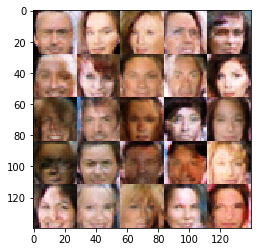

Epoch 2/5... Discriminator Loss: 1.3777... Generator Loss: 0.8362
Epoch 2/5... Discriminator Loss: 1.3625... Generator Loss: 0.8003
Epoch 2/5... Discriminator Loss: 1.3582... Generator Loss: 0.8171
Epoch 2/5... Discriminator Loss: 1.3419... Generator Loss: 0.8045
Epoch 2/5... Discriminator Loss: 1.3576... Generator Loss: 0.8286
Epoch 2/5... Discriminator Loss: 1.3410... Generator Loss: 0.8365
Epoch 2/5... Discriminator Loss: 1.3589... Generator Loss: 0.8086
Epoch 2/5... Discriminator Loss: 1.3447... Generator Loss: 0.8124
Epoch 2/5... Discriminator Loss: 1.3607... Generator Loss: 0.8124
Epoch 2/5... Discriminator Loss: 1.3557... Generator Loss: 0.7953


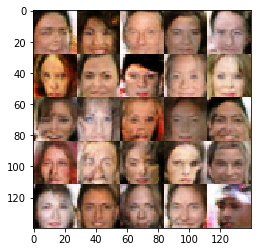

Epoch 2/5... Discriminator Loss: 1.3542... Generator Loss: 0.8557
Epoch 2/5... Discriminator Loss: 1.3615... Generator Loss: 0.8152
Epoch 2/5... Discriminator Loss: 1.3640... Generator Loss: 0.8029
Epoch 2/5... Discriminator Loss: 1.3635... Generator Loss: 0.7988
Epoch 2/5... Discriminator Loss: 1.3519... Generator Loss: 0.8244
Epoch 2/5... Discriminator Loss: 1.3602... Generator Loss: 0.8261
Epoch 2/5... Discriminator Loss: 1.3740... Generator Loss: 0.8235
Epoch 2/5... Discriminator Loss: 1.3632... Generator Loss: 0.8088
Epoch 2/5... Discriminator Loss: 1.3459... Generator Loss: 0.8225
Epoch 2/5... Discriminator Loss: 1.3580... Generator Loss: 0.8091


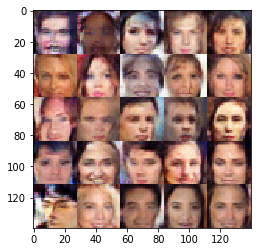

Epoch 2/5... Discriminator Loss: 1.3534... Generator Loss: 0.7954
Epoch 2/5... Discriminator Loss: 1.3792... Generator Loss: 0.8227
Epoch 2/5... Discriminator Loss: 1.3455... Generator Loss: 0.8490
Epoch 2/5... Discriminator Loss: 1.3671... Generator Loss: 0.8101
Epoch 2/5... Discriminator Loss: 1.3565... Generator Loss: 0.8340
Epoch 2/5... Discriminator Loss: 1.3534... Generator Loss: 0.8058
Epoch 2/5... Discriminator Loss: 1.3425... Generator Loss: 0.8157
Epoch 2/5... Discriminator Loss: 1.3718... Generator Loss: 0.8218
Epoch 2/5... Discriminator Loss: 1.3594... Generator Loss: 0.8069
Epoch 2/5... Discriminator Loss: 1.3608... Generator Loss: 0.8338


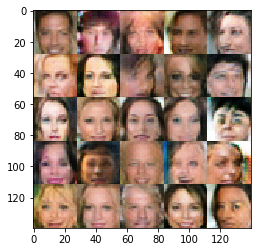

Epoch 2/5... Discriminator Loss: 1.3758... Generator Loss: 0.8005
Epoch 2/5... Discriminator Loss: 1.3776... Generator Loss: 0.8076
Epoch 2/5... Discriminator Loss: 1.3532... Generator Loss: 0.8056
Epoch 2/5... Discriminator Loss: 1.3682... Generator Loss: 0.8082
Epoch 2/5... Discriminator Loss: 1.3591... Generator Loss: 0.8232
Epoch 2/5... Discriminator Loss: 1.3566... Generator Loss: 0.8026
Epoch 2/5... Discriminator Loss: 1.3679... Generator Loss: 0.7864
Epoch 2/5... Discriminator Loss: 1.3478... Generator Loss: 0.8012
Epoch 2/5... Discriminator Loss: 1.3767... Generator Loss: 0.7993
Epoch 2/5... Discriminator Loss: 1.3586... Generator Loss: 0.8023


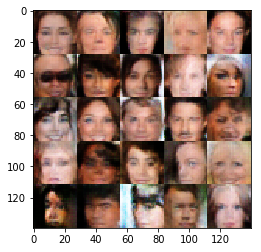

Epoch 2/5... Discriminator Loss: 1.3630... Generator Loss: 0.8173
Epoch 2/5... Discriminator Loss: 1.3651... Generator Loss: 0.8125
Epoch 2/5... Discriminator Loss: 1.3655... Generator Loss: 0.8110
Epoch 2/5... Discriminator Loss: 1.3582... Generator Loss: 0.8023
Epoch 2/5... Discriminator Loss: 1.3696... Generator Loss: 0.8275
Epoch 2/5... Discriminator Loss: 1.3693... Generator Loss: 0.8089
Epoch 2/5... Discriminator Loss: 1.3586... Generator Loss: 0.8198
Epoch 2/5... Discriminator Loss: 1.3495... Generator Loss: 0.8254
Epoch 2/5... Discriminator Loss: 1.3722... Generator Loss: 0.7929
Epoch 2/5... Discriminator Loss: 1.3501... Generator Loss: 0.8219


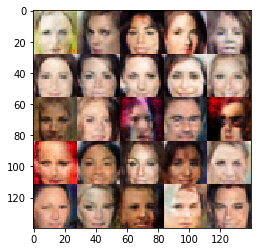

Epoch 2/5... Discriminator Loss: 1.3716... Generator Loss: 0.8255
Epoch 2/5... Discriminator Loss: 1.3544... Generator Loss: 0.8090
Epoch 2/5... Discriminator Loss: 1.3577... Generator Loss: 0.8223
Epoch 2/5... Discriminator Loss: 1.3544... Generator Loss: 0.8170
Epoch 2/5... Discriminator Loss: 1.3620... Generator Loss: 0.8170
Epoch 2/5... Discriminator Loss: 1.3701... Generator Loss: 0.7995
Epoch 2/5... Discriminator Loss: 1.3725... Generator Loss: 0.8041
Epoch 2/5... Discriminator Loss: 1.3543... Generator Loss: 0.8154
Epoch 2/5... Discriminator Loss: 1.3570... Generator Loss: 0.8165
Epoch 2/5... Discriminator Loss: 1.3691... Generator Loss: 0.8451


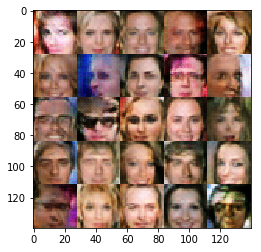

Epoch 2/5... Discriminator Loss: 1.3519... Generator Loss: 0.8148
Epoch 2/5... Discriminator Loss: 1.3827... Generator Loss: 0.8011
Epoch 2/5... Discriminator Loss: 1.3494... Generator Loss: 0.8124
Epoch 2/5... Discriminator Loss: 1.3433... Generator Loss: 0.8271
Epoch 2/5... Discriminator Loss: 1.3706... Generator Loss: 0.7927
Epoch 2/5... Discriminator Loss: 1.3572... Generator Loss: 0.7816
Epoch 2/5... Discriminator Loss: 1.3743... Generator Loss: 0.8088
Epoch 2/5... Discriminator Loss: 1.3620... Generator Loss: 0.8035
Epoch 2/5... Discriminator Loss: 1.3677... Generator Loss: 0.8304
Epoch 2/5... Discriminator Loss: 1.3709... Generator Loss: 0.8030


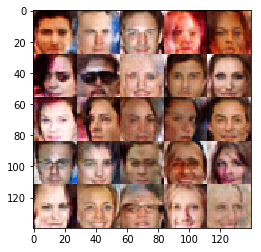

Epoch 2/5... Discriminator Loss: 1.3610... Generator Loss: 0.7933
Epoch 2/5... Discriminator Loss: 1.3637... Generator Loss: 0.8242
Epoch 2/5... Discriminator Loss: 1.3561... Generator Loss: 0.8149
Epoch 2/5... Discriminator Loss: 1.3636... Generator Loss: 0.8271
Epoch 2/5... Discriminator Loss: 1.3667... Generator Loss: 0.8087
Epoch 2/5... Discriminator Loss: 1.3635... Generator Loss: 0.8188
Epoch 2/5... Discriminator Loss: 1.3554... Generator Loss: 0.8130
Epoch 2/5... Discriminator Loss: 1.3553... Generator Loss: 0.8317
Epoch 2/5... Discriminator Loss: 1.3634... Generator Loss: 0.7893
Epoch 2/5... Discriminator Loss: 1.3560... Generator Loss: 0.8077


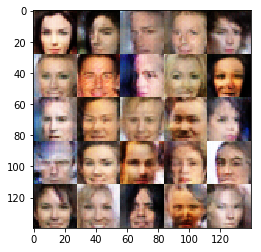

Epoch 2/5... Discriminator Loss: 1.3648... Generator Loss: 0.7867
Epoch 2/5... Discriminator Loss: 1.3568... Generator Loss: 0.7949
Epoch 2/5... Discriminator Loss: 1.3365... Generator Loss: 0.8425
Epoch 2/5... Discriminator Loss: 1.3706... Generator Loss: 0.8167
Epoch 2/5... Discriminator Loss: 1.3619... Generator Loss: 0.7971
Epoch 2/5... Discriminator Loss: 1.3483... Generator Loss: 0.8699
Epoch 2/5... Discriminator Loss: 1.3377... Generator Loss: 0.8191
Epoch 2/5... Discriminator Loss: 1.3603... Generator Loss: 0.8197
Epoch 2/5... Discriminator Loss: 1.3611... Generator Loss: 0.8298
Epoch 2/5... Discriminator Loss: 1.3656... Generator Loss: 0.8681


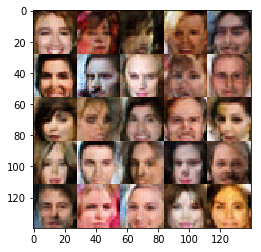

Epoch 2/5... Discriminator Loss: 1.3586... Generator Loss: 0.8000
Epoch 2/5... Discriminator Loss: 1.3482... Generator Loss: 0.8246
Epoch 2/5... Discriminator Loss: 1.3690... Generator Loss: 0.7969
Epoch 2/5... Discriminator Loss: 1.3454... Generator Loss: 0.7908
Epoch 2/5... Discriminator Loss: 1.3627... Generator Loss: 0.8037
Epoch 2/5... Discriminator Loss: 1.3417... Generator Loss: 0.8128
Epoch 2/5... Discriminator Loss: 1.3630... Generator Loss: 0.8398
Epoch 2/5... Discriminator Loss: 1.3728... Generator Loss: 0.8030
Epoch 2/5... Discriminator Loss: 1.3735... Generator Loss: 0.7927
Epoch 2/5... Discriminator Loss: 1.3665... Generator Loss: 0.8111


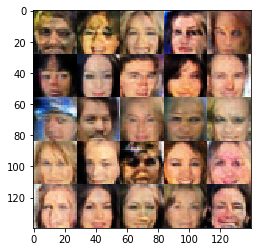

Epoch 2/5... Discriminator Loss: 1.3645... Generator Loss: 0.8052
Epoch 2/5... Discriminator Loss: 1.3566... Generator Loss: 0.8067
Epoch 2/5... Discriminator Loss: 1.3638... Generator Loss: 0.8161
Epoch 2/5... Discriminator Loss: 1.3672... Generator Loss: 0.7982
Epoch 2/5... Discriminator Loss: 1.3788... Generator Loss: 0.7937
Epoch 2/5... Discriminator Loss: 1.3885... Generator Loss: 0.8113
Epoch 2/5... Discriminator Loss: 1.3638... Generator Loss: 0.8370
Epoch 2/5... Discriminator Loss: 1.3752... Generator Loss: 0.8126
Epoch 2/5... Discriminator Loss: 1.3664... Generator Loss: 0.7993
Epoch 2/5... Discriminator Loss: 1.3641... Generator Loss: 0.8129


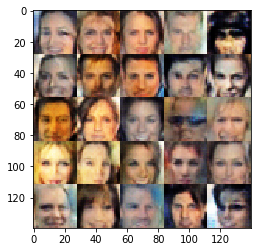

Epoch 2/5... Discriminator Loss: 1.3885... Generator Loss: 0.8118
Epoch 2/5... Discriminator Loss: 1.3658... Generator Loss: 0.8215
Epoch 2/5... Discriminator Loss: 1.3659... Generator Loss: 0.7909
Epoch 2/5... Discriminator Loss: 1.3648... Generator Loss: 0.7946
Epoch 2/5... Discriminator Loss: 1.3677... Generator Loss: 0.8431
Epoch 2/5... Discriminator Loss: 1.3661... Generator Loss: 0.8146
Epoch 2/5... Discriminator Loss: 1.3523... Generator Loss: 0.8159
Epoch 2/5... Discriminator Loss: 1.3486... Generator Loss: 0.8197
Epoch 2/5... Discriminator Loss: 1.3852... Generator Loss: 0.8397
Epoch 2/5... Discriminator Loss: 1.3630... Generator Loss: 0.7963


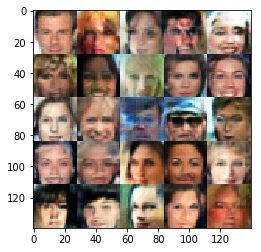

Epoch 2/5... Discriminator Loss: 1.3498... Generator Loss: 0.8288
Epoch 2/5... Discriminator Loss: 1.3616... Generator Loss: 0.8058
Epoch 2/5... Discriminator Loss: 1.3685... Generator Loss: 0.8318
Epoch 2/5... Discriminator Loss: 1.3378... Generator Loss: 0.8050
Epoch 2/5... Discriminator Loss: 1.3689... Generator Loss: 0.8405
Epoch 2/5... Discriminator Loss: 1.3538... Generator Loss: 0.8118
Epoch 2/5... Discriminator Loss: 1.3646... Generator Loss: 0.8315
Epoch 2/5... Discriminator Loss: 1.3598... Generator Loss: 0.8111
Epoch 2/5... Discriminator Loss: 1.3648... Generator Loss: 0.8163
Epoch 2/5... Discriminator Loss: 1.3639... Generator Loss: 0.8115


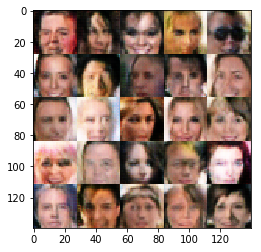

Epoch 2/5... Discriminator Loss: 1.3609... Generator Loss: 0.8296
Epoch 2/5... Discriminator Loss: 1.3703... Generator Loss: 0.8211
Epoch 2/5... Discriminator Loss: 1.3711... Generator Loss: 0.8197
Epoch 2/5... Discriminator Loss: 1.3723... Generator Loss: 0.8091
Epoch 2/5... Discriminator Loss: 1.3515... Generator Loss: 0.8215
Epoch 2/5... Discriminator Loss: 1.3621... Generator Loss: 0.8369
Epoch 2/5... Discriminator Loss: 1.3625... Generator Loss: 0.7832
Epoch 2/5... Discriminator Loss: 1.3631... Generator Loss: 0.8190
Epoch 2/5... Discriminator Loss: 1.3612... Generator Loss: 0.7983
Epoch 2/5... Discriminator Loss: 1.3563... Generator Loss: 0.8320


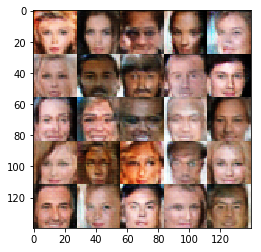

Epoch 2/5... Discriminator Loss: 1.3422... Generator Loss: 0.8313
Epoch 2/5... Discriminator Loss: 1.3755... Generator Loss: 0.8045
Epoch 2/5... Discriminator Loss: 1.3684... Generator Loss: 0.8002
Epoch 2/5... Discriminator Loss: 1.3685... Generator Loss: 0.8123
Epoch 2/5... Discriminator Loss: 1.3735... Generator Loss: 0.8068
Epoch 2/5... Discriminator Loss: 1.3565... Generator Loss: 0.8041
Epoch 2/5... Discriminator Loss: 1.3690... Generator Loss: 0.8045
Epoch 2/5... Discriminator Loss: 1.3584... Generator Loss: 0.8097
Epoch 2/5... Discriminator Loss: 1.3583... Generator Loss: 0.8274
Epoch 2/5... Discriminator Loss: 1.3594... Generator Loss: 0.8076


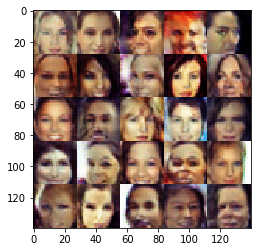

Epoch 2/5... Discriminator Loss: 1.3570... Generator Loss: 0.7990
Epoch 2/5... Discriminator Loss: 1.3567... Generator Loss: 0.8346
Epoch 2/5... Discriminator Loss: 1.3662... Generator Loss: 0.8139
Epoch 3/5... Discriminator Loss: 1.3578... Generator Loss: 0.8141
Epoch 3/5... Discriminator Loss: 1.3801... Generator Loss: 0.7946
Epoch 3/5... Discriminator Loss: 1.3703... Generator Loss: 0.8218
Epoch 3/5... Discriminator Loss: 1.3679... Generator Loss: 0.8175
Epoch 3/5... Discriminator Loss: 1.3747... Generator Loss: 0.7916
Epoch 3/5... Discriminator Loss: 1.3756... Generator Loss: 0.8095
Epoch 3/5... Discriminator Loss: 1.3394... Generator Loss: 0.8027


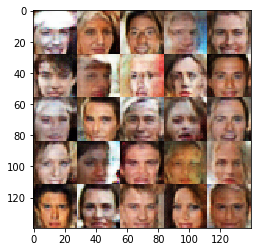

Epoch 3/5... Discriminator Loss: 1.3598... Generator Loss: 0.8256
Epoch 3/5... Discriminator Loss: 1.3700... Generator Loss: 0.7982
Epoch 3/5... Discriminator Loss: 1.3754... Generator Loss: 0.8010
Epoch 3/5... Discriminator Loss: 1.3752... Generator Loss: 0.8326
Epoch 3/5... Discriminator Loss: 1.3703... Generator Loss: 0.8089
Epoch 3/5... Discriminator Loss: 1.3746... Generator Loss: 0.8293
Epoch 3/5... Discriminator Loss: 1.3608... Generator Loss: 0.8107
Epoch 3/5... Discriminator Loss: 1.3620... Generator Loss: 0.8030
Epoch 3/5... Discriminator Loss: 1.3679... Generator Loss: 0.8047
Epoch 3/5... Discriminator Loss: 1.3781... Generator Loss: 0.8259


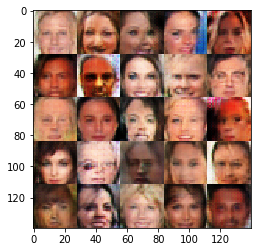

Epoch 3/5... Discriminator Loss: 1.3630... Generator Loss: 0.8320
Epoch 3/5... Discriminator Loss: 1.3676... Generator Loss: 0.8003
Epoch 3/5... Discriminator Loss: 1.3688... Generator Loss: 0.8061
Epoch 3/5... Discriminator Loss: 1.3464... Generator Loss: 0.7999
Epoch 3/5... Discriminator Loss: 1.3453... Generator Loss: 0.8558
Epoch 3/5... Discriminator Loss: 1.3564... Generator Loss: 0.8321
Epoch 3/5... Discriminator Loss: 1.3753... Generator Loss: 0.8236
Epoch 3/5... Discriminator Loss: 1.3703... Generator Loss: 0.8048
Epoch 3/5... Discriminator Loss: 1.3674... Generator Loss: 0.8021
Epoch 3/5... Discriminator Loss: 1.3696... Generator Loss: 0.8234


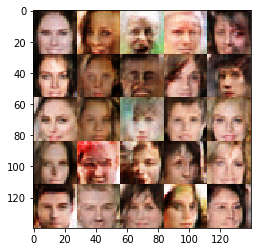

Epoch 3/5... Discriminator Loss: 1.3573... Generator Loss: 0.8129
Epoch 3/5... Discriminator Loss: 1.3516... Generator Loss: 0.8312
Epoch 3/5... Discriminator Loss: 1.3679... Generator Loss: 0.7878
Epoch 3/5... Discriminator Loss: 1.3646... Generator Loss: 0.8068
Epoch 3/5... Discriminator Loss: 1.3489... Generator Loss: 0.8032
Epoch 3/5... Discriminator Loss: 1.3629... Generator Loss: 0.7915
Epoch 3/5... Discriminator Loss: 1.3722... Generator Loss: 0.8044
Epoch 3/5... Discriminator Loss: 1.3698... Generator Loss: 0.8113
Epoch 3/5... Discriminator Loss: 1.3715... Generator Loss: 0.8129
Epoch 3/5... Discriminator Loss: 1.3721... Generator Loss: 0.8107


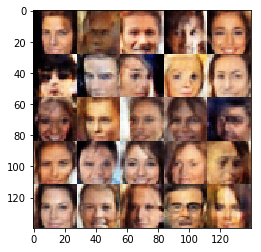

Epoch 3/5... Discriminator Loss: 1.3334... Generator Loss: 0.8021
Epoch 3/5... Discriminator Loss: 1.3499... Generator Loss: 0.8075
Epoch 3/5... Discriminator Loss: 1.3528... Generator Loss: 0.8048
Epoch 3/5... Discriminator Loss: 1.3522... Generator Loss: 0.9029
Epoch 3/5... Discriminator Loss: 1.3736... Generator Loss: 0.8187
Epoch 3/5... Discriminator Loss: 1.3609... Generator Loss: 0.8375
Epoch 3/5... Discriminator Loss: 1.3529... Generator Loss: 0.8054
Epoch 3/5... Discriminator Loss: 1.3670... Generator Loss: 0.8153
Epoch 3/5... Discriminator Loss: 1.3474... Generator Loss: 0.8127
Epoch 3/5... Discriminator Loss: 1.3736... Generator Loss: 0.7871


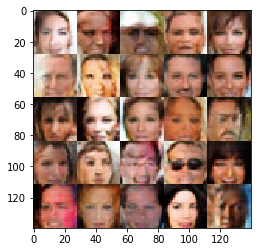

Epoch 3/5... Discriminator Loss: 1.3477... Generator Loss: 0.8188
Epoch 3/5... Discriminator Loss: 1.3667... Generator Loss: 0.8105
Epoch 3/5... Discriminator Loss: 1.3683... Generator Loss: 0.8447
Epoch 3/5... Discriminator Loss: 1.3735... Generator Loss: 0.8018
Epoch 3/5... Discriminator Loss: 1.3420... Generator Loss: 0.8093
Epoch 3/5... Discriminator Loss: 1.3519... Generator Loss: 0.7980
Epoch 3/5... Discriminator Loss: 1.3613... Generator Loss: 0.8048
Epoch 3/5... Discriminator Loss: 1.3744... Generator Loss: 0.8125
Epoch 3/5... Discriminator Loss: 1.3735... Generator Loss: 0.7984
Epoch 3/5... Discriminator Loss: 1.3491... Generator Loss: 0.8005


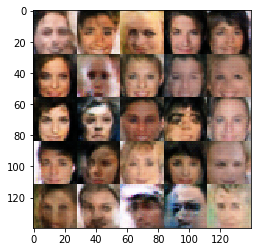

Epoch 3/5... Discriminator Loss: 1.3637... Generator Loss: 0.8119
Epoch 3/5... Discriminator Loss: 1.3747... Generator Loss: 0.8067
Epoch 3/5... Discriminator Loss: 1.3610... Generator Loss: 0.8479
Epoch 3/5... Discriminator Loss: 1.3590... Generator Loss: 0.8262
Epoch 3/5... Discriminator Loss: 1.3609... Generator Loss: 0.7904
Epoch 3/5... Discriminator Loss: 1.3675... Generator Loss: 0.8084
Epoch 3/5... Discriminator Loss: 1.3673... Generator Loss: 0.8032
Epoch 3/5... Discriminator Loss: 1.3682... Generator Loss: 0.8044
Epoch 3/5... Discriminator Loss: 1.3470... Generator Loss: 0.8094
Epoch 3/5... Discriminator Loss: 1.3622... Generator Loss: 0.8146


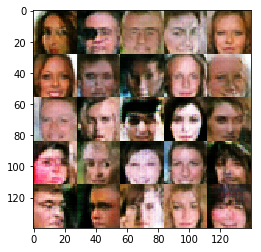

Epoch 3/5... Discriminator Loss: 1.3606... Generator Loss: 0.8138
Epoch 3/5... Discriminator Loss: 1.3684... Generator Loss: 0.8020
Epoch 3/5... Discriminator Loss: 1.3571... Generator Loss: 0.8120
Epoch 3/5... Discriminator Loss: 1.3599... Generator Loss: 0.7908
Epoch 3/5... Discriminator Loss: 1.3555... Generator Loss: 0.8244
Epoch 3/5... Discriminator Loss: 1.3599... Generator Loss: 0.8005
Epoch 3/5... Discriminator Loss: 1.3613... Generator Loss: 0.8169
Epoch 3/5... Discriminator Loss: 1.3751... Generator Loss: 0.8031
Epoch 3/5... Discriminator Loss: 1.3753... Generator Loss: 0.8078
Epoch 3/5... Discriminator Loss: 1.3708... Generator Loss: 0.8157


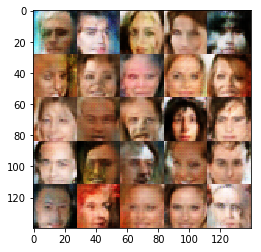

Epoch 3/5... Discriminator Loss: 1.3505... Generator Loss: 0.8009
Epoch 3/5... Discriminator Loss: 1.3500... Generator Loss: 0.8060
Epoch 3/5... Discriminator Loss: 1.3669... Generator Loss: 0.8442
Epoch 3/5... Discriminator Loss: 1.3351... Generator Loss: 0.8214
Epoch 3/5... Discriminator Loss: 1.3584... Generator Loss: 0.8172
Epoch 3/5... Discriminator Loss: 1.3736... Generator Loss: 0.7973
Epoch 3/5... Discriminator Loss: 1.3738... Generator Loss: 0.8023
Epoch 3/5... Discriminator Loss: 1.3825... Generator Loss: 0.8255
Epoch 3/5... Discriminator Loss: 1.3700... Generator Loss: 0.7778
Epoch 3/5... Discriminator Loss: 1.3702... Generator Loss: 0.8344


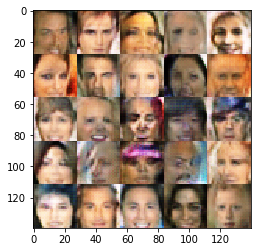

Epoch 3/5... Discriminator Loss: 1.3636... Generator Loss: 0.8200
Epoch 3/5... Discriminator Loss: 1.3540... Generator Loss: 0.8019
Epoch 3/5... Discriminator Loss: 1.3521... Generator Loss: 0.7984
Epoch 3/5... Discriminator Loss: 1.3714... Generator Loss: 0.8292
Epoch 3/5... Discriminator Loss: 1.3519... Generator Loss: 0.8096
Epoch 3/5... Discriminator Loss: 1.3754... Generator Loss: 0.7889
Epoch 3/5... Discriminator Loss: 1.3465... Generator Loss: 0.8030
Epoch 3/5... Discriminator Loss: 1.3715... Generator Loss: 0.8080
Epoch 3/5... Discriminator Loss: 1.3759... Generator Loss: 0.7797
Epoch 3/5... Discriminator Loss: 1.3770... Generator Loss: 0.8180


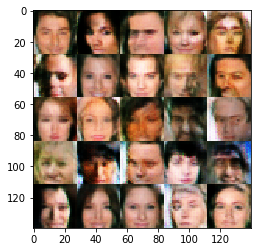

Epoch 3/5... Discriminator Loss: 1.3670... Generator Loss: 0.8080
Epoch 3/5... Discriminator Loss: 1.3799... Generator Loss: 0.8546
Epoch 3/5... Discriminator Loss: 1.3587... Generator Loss: 0.8177
Epoch 3/5... Discriminator Loss: 1.3625... Generator Loss: 0.8141
Epoch 3/5... Discriminator Loss: 1.3709... Generator Loss: 0.7888
Epoch 3/5... Discriminator Loss: 1.3572... Generator Loss: 0.8133
Epoch 3/5... Discriminator Loss: 1.3748... Generator Loss: 0.7964
Epoch 3/5... Discriminator Loss: 1.3660... Generator Loss: 0.8140
Epoch 3/5... Discriminator Loss: 1.3581... Generator Loss: 0.8065
Epoch 3/5... Discriminator Loss: 1.3642... Generator Loss: 0.8177


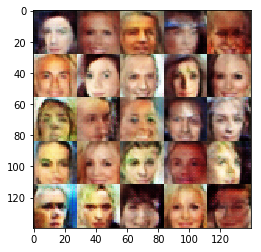

Epoch 3/5... Discriminator Loss: 1.3755... Generator Loss: 0.7988
Epoch 3/5... Discriminator Loss: 1.3580... Generator Loss: 0.8152
Epoch 3/5... Discriminator Loss: 1.3564... Generator Loss: 0.8349
Epoch 3/5... Discriminator Loss: 1.3594... Generator Loss: 0.8102
Epoch 3/5... Discriminator Loss: 1.3804... Generator Loss: 0.8051
Epoch 3/5... Discriminator Loss: 1.3746... Generator Loss: 0.8046
Epoch 3/5... Discriminator Loss: 1.3724... Generator Loss: 0.8005
Epoch 3/5... Discriminator Loss: 1.3713... Generator Loss: 0.8026
Epoch 3/5... Discriminator Loss: 1.3698... Generator Loss: 0.8043
Epoch 3/5... Discriminator Loss: 1.3645... Generator Loss: 0.8047


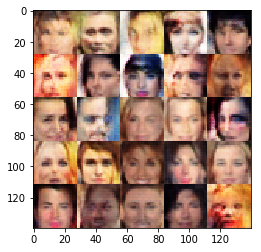

Epoch 3/5... Discriminator Loss: 1.3763... Generator Loss: 0.7879
Epoch 3/5... Discriminator Loss: 1.3742... Generator Loss: 0.8048
Epoch 3/5... Discriminator Loss: 1.3804... Generator Loss: 0.7965
Epoch 3/5... Discriminator Loss: 1.3656... Generator Loss: 0.7911
Epoch 3/5... Discriminator Loss: 1.3677... Generator Loss: 0.8168
Epoch 3/5... Discriminator Loss: 1.3746... Generator Loss: 0.7965
Epoch 3/5... Discriminator Loss: 1.3774... Generator Loss: 0.8095
Epoch 3/5... Discriminator Loss: 1.3687... Generator Loss: 0.8105
Epoch 3/5... Discriminator Loss: 1.3637... Generator Loss: 0.7969
Epoch 3/5... Discriminator Loss: 1.3694... Generator Loss: 0.8095


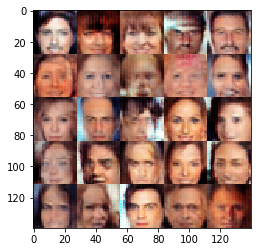

Epoch 3/5... Discriminator Loss: 1.3802... Generator Loss: 0.7829
Epoch 3/5... Discriminator Loss: 1.3721... Generator Loss: 0.8216
Epoch 3/5... Discriminator Loss: 1.3669... Generator Loss: 0.8115
Epoch 3/5... Discriminator Loss: 1.3697... Generator Loss: 0.8056
Epoch 3/5... Discriminator Loss: 1.3701... Generator Loss: 0.8124
Epoch 3/5... Discriminator Loss: 1.3743... Generator Loss: 0.7943
Epoch 3/5... Discriminator Loss: 1.3594... Generator Loss: 0.8185
Epoch 3/5... Discriminator Loss: 1.3622... Generator Loss: 0.8175
Epoch 3/5... Discriminator Loss: 1.3635... Generator Loss: 0.8086
Epoch 3/5... Discriminator Loss: 1.3654... Generator Loss: 0.8341


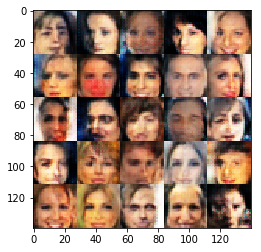

Epoch 3/5... Discriminator Loss: 1.3734... Generator Loss: 0.7846
Epoch 3/5... Discriminator Loss: 1.3571... Generator Loss: 0.8148
Epoch 3/5... Discriminator Loss: 1.3755... Generator Loss: 0.7982
Epoch 3/5... Discriminator Loss: 1.3728... Generator Loss: 0.8156
Epoch 3/5... Discriminator Loss: 1.3522... Generator Loss: 0.8401
Epoch 3/5... Discriminator Loss: 1.3727... Generator Loss: 0.7941
Epoch 3/5... Discriminator Loss: 1.3761... Generator Loss: 0.8048
Epoch 3/5... Discriminator Loss: 1.3702... Generator Loss: 0.7941
Epoch 3/5... Discriminator Loss: 1.3615... Generator Loss: 0.8146
Epoch 3/5... Discriminator Loss: 1.3614... Generator Loss: 0.8099


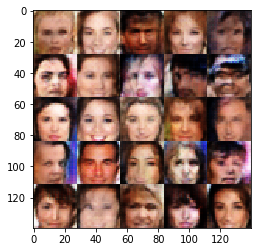

Epoch 3/5... Discriminator Loss: 1.3785... Generator Loss: 0.8032
Epoch 3/5... Discriminator Loss: 1.3661... Generator Loss: 0.8170
Epoch 3/5... Discriminator Loss: 1.3676... Generator Loss: 0.8059
Epoch 3/5... Discriminator Loss: 1.3690... Generator Loss: 0.8084
Epoch 3/5... Discriminator Loss: 1.3661... Generator Loss: 0.8110
Epoch 3/5... Discriminator Loss: 1.3737... Generator Loss: 0.8052
Epoch 3/5... Discriminator Loss: 1.3561... Generator Loss: 0.8136
Epoch 3/5... Discriminator Loss: 1.3580... Generator Loss: 0.8174
Epoch 3/5... Discriminator Loss: 1.3730... Generator Loss: 0.8140
Epoch 3/5... Discriminator Loss: 1.3696... Generator Loss: 0.8174


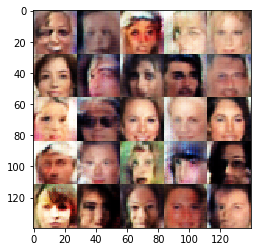

Epoch 3/5... Discriminator Loss: 1.3719... Generator Loss: 0.8192
Epoch 3/5... Discriminator Loss: 1.3624... Generator Loss: 0.8200
Epoch 3/5... Discriminator Loss: 1.3783... Generator Loss: 0.7921
Epoch 3/5... Discriminator Loss: 1.3654... Generator Loss: 0.8091
Epoch 3/5... Discriminator Loss: 1.3702... Generator Loss: 0.8030
Epoch 3/5... Discriminator Loss: 1.3883... Generator Loss: 0.7761
Epoch 3/5... Discriminator Loss: 1.3622... Generator Loss: 0.8037
Epoch 3/5... Discriminator Loss: 1.3686... Generator Loss: 0.8166
Epoch 3/5... Discriminator Loss: 1.3749... Generator Loss: 0.7951
Epoch 3/5... Discriminator Loss: 1.3717... Generator Loss: 0.7901


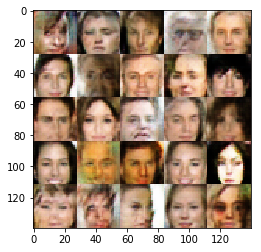

Epoch 3/5... Discriminator Loss: 1.3570... Generator Loss: 0.8179
Epoch 3/5... Discriminator Loss: 1.3737... Generator Loss: 0.8151
Epoch 3/5... Discriminator Loss: 1.3688... Generator Loss: 0.8018
Epoch 3/5... Discriminator Loss: 1.3664... Generator Loss: 0.8348
Epoch 3/5... Discriminator Loss: 1.3696... Generator Loss: 0.7922
Epoch 3/5... Discriminator Loss: 1.3666... Generator Loss: 0.7935
Epoch 3/5... Discriminator Loss: 1.3644... Generator Loss: 0.8089
Epoch 3/5... Discriminator Loss: 1.3712... Generator Loss: 0.8013
Epoch 3/5... Discriminator Loss: 1.3794... Generator Loss: 0.7875
Epoch 3/5... Discriminator Loss: 1.3778... Generator Loss: 0.7953


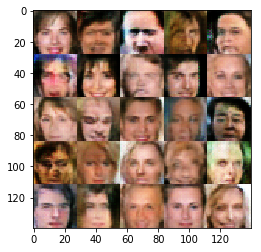

Epoch 3/5... Discriminator Loss: 1.3724... Generator Loss: 0.8013
Epoch 3/5... Discriminator Loss: 1.3647... Generator Loss: 0.8066
Epoch 3/5... Discriminator Loss: 1.3634... Generator Loss: 0.8276
Epoch 3/5... Discriminator Loss: 1.3523... Generator Loss: 0.7920
Epoch 3/5... Discriminator Loss: 1.3605... Generator Loss: 0.8216
Epoch 3/5... Discriminator Loss: 1.3577... Generator Loss: 0.8361
Epoch 3/5... Discriminator Loss: 1.3761... Generator Loss: 0.8684
Epoch 3/5... Discriminator Loss: 1.3514... Generator Loss: 0.8337
Epoch 3/5... Discriminator Loss: 1.3751... Generator Loss: 0.8307
Epoch 3/5... Discriminator Loss: 1.3707... Generator Loss: 0.7999


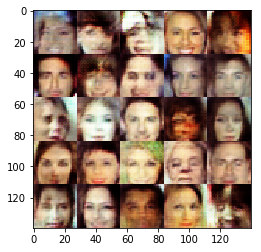

Epoch 3/5... Discriminator Loss: 1.3585... Generator Loss: 0.8296
Epoch 3/5... Discriminator Loss: 1.3708... Generator Loss: 0.7710
Epoch 3/5... Discriminator Loss: 1.3474... Generator Loss: 0.8159
Epoch 3/5... Discriminator Loss: 1.3337... Generator Loss: 0.8556
Epoch 3/5... Discriminator Loss: 1.3690... Generator Loss: 0.8261
Epoch 3/5... Discriminator Loss: 1.3662... Generator Loss: 0.8078
Epoch 3/5... Discriminator Loss: 1.3719... Generator Loss: 0.8045
Epoch 3/5... Discriminator Loss: 1.3698... Generator Loss: 0.7969
Epoch 3/5... Discriminator Loss: 1.3661... Generator Loss: 0.8209
Epoch 3/5... Discriminator Loss: 1.3648... Generator Loss: 0.8190


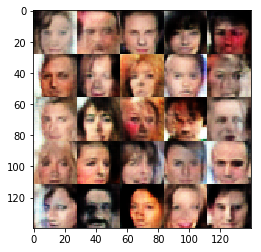

Epoch 3/5... Discriminator Loss: 1.3698... Generator Loss: 0.7961
Epoch 3/5... Discriminator Loss: 1.3704... Generator Loss: 0.8119
Epoch 3/5... Discriminator Loss: 1.3583... Generator Loss: 0.8145
Epoch 3/5... Discriminator Loss: 1.3749... Generator Loss: 0.7988
Epoch 3/5... Discriminator Loss: 1.3694... Generator Loss: 0.8127
Epoch 3/5... Discriminator Loss: 1.3574... Generator Loss: 0.8249
Epoch 3/5... Discriminator Loss: 1.3295... Generator Loss: 0.8750
Epoch 3/5... Discriminator Loss: 1.3155... Generator Loss: 0.8198
Epoch 3/5... Discriminator Loss: 1.3718... Generator Loss: 0.8404
Epoch 3/5... Discriminator Loss: 1.3531... Generator Loss: 0.8509


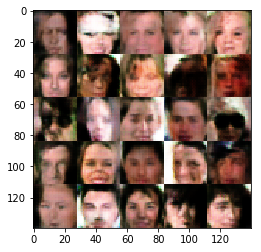

Epoch 3/5... Discriminator Loss: 1.3604... Generator Loss: 0.8057
Epoch 3/5... Discriminator Loss: 1.3692... Generator Loss: 0.8240
Epoch 3/5... Discriminator Loss: 1.3550... Generator Loss: 0.8191
Epoch 3/5... Discriminator Loss: 1.3651... Generator Loss: 0.8119
Epoch 3/5... Discriminator Loss: 1.3502... Generator Loss: 0.8094
Epoch 3/5... Discriminator Loss: 1.3563... Generator Loss: 0.8108
Epoch 3/5... Discriminator Loss: 1.3660... Generator Loss: 0.8252
Epoch 3/5... Discriminator Loss: 1.3564... Generator Loss: 0.8223
Epoch 3/5... Discriminator Loss: 1.3714... Generator Loss: 0.8005
Epoch 3/5... Discriminator Loss: 1.3728... Generator Loss: 0.7938


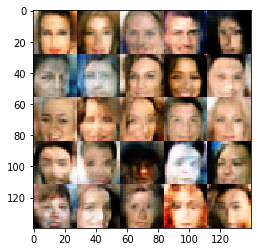

Epoch 3/5... Discriminator Loss: 1.3743... Generator Loss: 0.7992
Epoch 3/5... Discriminator Loss: 1.3654... Generator Loss: 0.8166
Epoch 3/5... Discriminator Loss: 1.3628... Generator Loss: 0.8129
Epoch 3/5... Discriminator Loss: 1.3737... Generator Loss: 0.7994
Epoch 3/5... Discriminator Loss: 1.3710... Generator Loss: 0.8083
Epoch 3/5... Discriminator Loss: 1.3746... Generator Loss: 0.7941
Epoch 3/5... Discriminator Loss: 1.3782... Generator Loss: 0.8087
Epoch 3/5... Discriminator Loss: 1.3783... Generator Loss: 0.7979
Epoch 3/5... Discriminator Loss: 1.3639... Generator Loss: 0.8035
Epoch 3/5... Discriminator Loss: 1.3788... Generator Loss: 0.7939


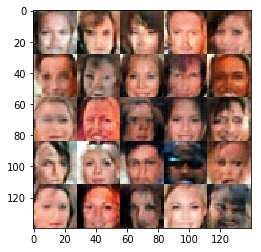

Epoch 3/5... Discriminator Loss: 1.3712... Generator Loss: 0.7960
Epoch 3/5... Discriminator Loss: 1.3793... Generator Loss: 0.7976
Epoch 3/5... Discriminator Loss: 1.3718... Generator Loss: 0.7945
Epoch 3/5... Discriminator Loss: 1.3753... Generator Loss: 0.7952
Epoch 3/5... Discriminator Loss: 1.3702... Generator Loss: 0.8136
Epoch 3/5... Discriminator Loss: 1.3800... Generator Loss: 0.7892
Epoch 3/5... Discriminator Loss: 1.3683... Generator Loss: 0.8028
Epoch 3/5... Discriminator Loss: 1.3806... Generator Loss: 0.8056
Epoch 3/5... Discriminator Loss: 1.3676... Generator Loss: 0.8072
Epoch 3/5... Discriminator Loss: 1.3784... Generator Loss: 0.8063


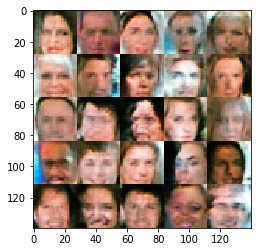

Epoch 3/5... Discriminator Loss: 1.3737... Generator Loss: 0.7978
Epoch 3/5... Discriminator Loss: 1.3701... Generator Loss: 0.8018
Epoch 3/5... Discriminator Loss: 1.3729... Generator Loss: 0.7953
Epoch 3/5... Discriminator Loss: 1.3725... Generator Loss: 0.7989
Epoch 3/5... Discriminator Loss: 1.3616... Generator Loss: 0.8169
Epoch 3/5... Discriminator Loss: 1.3711... Generator Loss: 0.8041
Epoch 3/5... Discriminator Loss: 1.3733... Generator Loss: 0.7955
Epoch 3/5... Discriminator Loss: 1.3788... Generator Loss: 0.7978
Epoch 3/5... Discriminator Loss: 1.3628... Generator Loss: 0.8035
Epoch 3/5... Discriminator Loss: 1.3629... Generator Loss: 0.8018


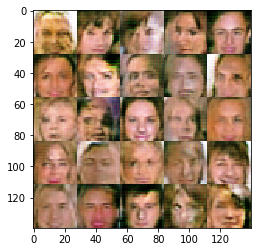

Epoch 3/5... Discriminator Loss: 1.3663... Generator Loss: 0.8010
Epoch 3/5... Discriminator Loss: 1.3739... Generator Loss: 0.8188
Epoch 3/5... Discriminator Loss: 1.3768... Generator Loss: 0.7985
Epoch 3/5... Discriminator Loss: 1.3717... Generator Loss: 0.8016
Epoch 3/5... Discriminator Loss: 1.3785... Generator Loss: 0.8035
Epoch 3/5... Discriminator Loss: 1.3724... Generator Loss: 0.8058
Epoch 3/5... Discriminator Loss: 1.3727... Generator Loss: 0.8018
Epoch 3/5... Discriminator Loss: 1.3742... Generator Loss: 0.8023
Epoch 3/5... Discriminator Loss: 1.3746... Generator Loss: 0.8061
Epoch 3/5... Discriminator Loss: 1.3748... Generator Loss: 0.7991


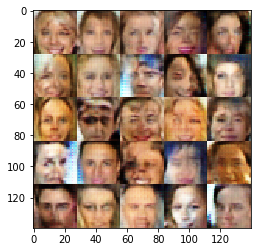

Epoch 3/5... Discriminator Loss: 1.3751... Generator Loss: 0.8038
Epoch 3/5... Discriminator Loss: 1.3736... Generator Loss: 0.7971
Epoch 3/5... Discriminator Loss: 1.3712... Generator Loss: 0.8042
Epoch 3/5... Discriminator Loss: 1.3727... Generator Loss: 0.7986
Epoch 3/5... Discriminator Loss: 1.3772... Generator Loss: 0.7961
Epoch 3/5... Discriminator Loss: 1.3714... Generator Loss: 0.8009
Epoch 3/5... Discriminator Loss: 1.3734... Generator Loss: 0.8031
Epoch 3/5... Discriminator Loss: 1.3741... Generator Loss: 0.7951
Epoch 3/5... Discriminator Loss: 1.3776... Generator Loss: 0.7999
Epoch 3/5... Discriminator Loss: 1.3733... Generator Loss: 0.8133


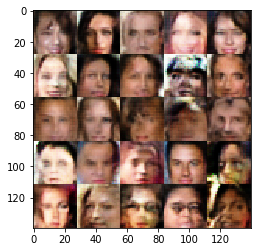

Epoch 3/5... Discriminator Loss: 1.3725... Generator Loss: 0.8037
Epoch 3/5... Discriminator Loss: 1.3652... Generator Loss: 0.8030
Epoch 3/5... Discriminator Loss: 1.3700... Generator Loss: 0.8036
Epoch 3/5... Discriminator Loss: 1.3728... Generator Loss: 0.8007
Epoch 3/5... Discriminator Loss: 1.3716... Generator Loss: 0.8044
Epoch 3/5... Discriminator Loss: 1.3788... Generator Loss: 0.7918
Epoch 3/5... Discriminator Loss: 1.3738... Generator Loss: 0.8028
Epoch 3/5... Discriminator Loss: 1.3767... Generator Loss: 0.8041
Epoch 3/5... Discriminator Loss: 1.3701... Generator Loss: 0.8117
Epoch 3/5... Discriminator Loss: 1.3660... Generator Loss: 0.8082


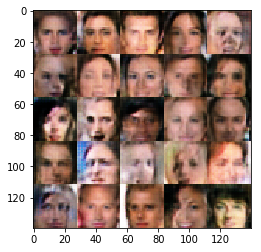

Epoch 3/5... Discriminator Loss: 1.3756... Generator Loss: 0.7954
Epoch 3/5... Discriminator Loss: 1.3701... Generator Loss: 0.8041
Epoch 3/5... Discriminator Loss: 1.3830... Generator Loss: 0.7938
Epoch 3/5... Discriminator Loss: 1.3753... Generator Loss: 0.8120
Epoch 3/5... Discriminator Loss: 1.3586... Generator Loss: 0.8058
Epoch 3/5... Discriminator Loss: 1.3613... Generator Loss: 0.8148
Epoch 3/5... Discriminator Loss: 1.3549... Generator Loss: 0.7952
Epoch 3/5... Discriminator Loss: 1.3693... Generator Loss: 0.8037
Epoch 3/5... Discriminator Loss: 1.3659... Generator Loss: 0.8061
Epoch 3/5... Discriminator Loss: 1.3707... Generator Loss: 0.8193


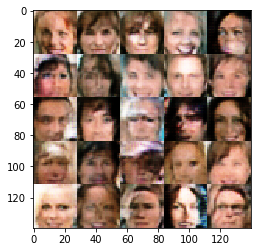

Epoch 3/5... Discriminator Loss: 1.3586... Generator Loss: 0.8184
Epoch 3/5... Discriminator Loss: 1.3766... Generator Loss: 0.7953
Epoch 3/5... Discriminator Loss: 1.3778... Generator Loss: 0.8139
Epoch 3/5... Discriminator Loss: 1.3777... Generator Loss: 0.8035
Epoch 3/5... Discriminator Loss: 1.3742... Generator Loss: 0.8104
Epoch 3/5... Discriminator Loss: 1.3746... Generator Loss: 0.8017
Epoch 3/5... Discriminator Loss: 1.3737... Generator Loss: 0.7990
Epoch 3/5... Discriminator Loss: 1.3743... Generator Loss: 0.8039
Epoch 3/5... Discriminator Loss: 1.3748... Generator Loss: 0.8036
Epoch 3/5... Discriminator Loss: 1.3713... Generator Loss: 0.8126


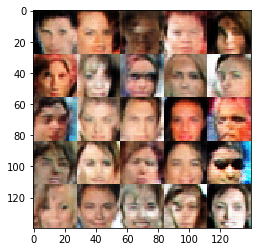

Epoch 3/5... Discriminator Loss: 1.3707... Generator Loss: 0.7997
Epoch 3/5... Discriminator Loss: 1.3724... Generator Loss: 0.7971
Epoch 3/5... Discriminator Loss: 1.3687... Generator Loss: 0.8236
Epoch 3/5... Discriminator Loss: 1.3675... Generator Loss: 0.8221
Epoch 3/5... Discriminator Loss: 1.3757... Generator Loss: 0.7973
Epoch 3/5... Discriminator Loss: 1.3600... Generator Loss: 0.8134
Epoch 3/5... Discriminator Loss: 1.3780... Generator Loss: 0.8012
Epoch 3/5... Discriminator Loss: 1.3704... Generator Loss: 0.8039
Epoch 3/5... Discriminator Loss: 1.3723... Generator Loss: 0.7979
Epoch 3/5... Discriminator Loss: 1.3789... Generator Loss: 0.7965


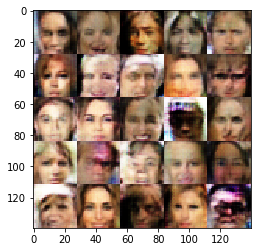

Epoch 3/5... Discriminator Loss: 1.3709... Generator Loss: 0.8037
Epoch 3/5... Discriminator Loss: 1.3786... Generator Loss: 0.7944
Epoch 3/5... Discriminator Loss: 1.3709... Generator Loss: 0.8060
Epoch 3/5... Discriminator Loss: 1.3765... Generator Loss: 0.7992
Epoch 3/5... Discriminator Loss: 1.3760... Generator Loss: 0.8044
Epoch 3/5... Discriminator Loss: 1.3755... Generator Loss: 0.8037
Epoch 3/5... Discriminator Loss: 1.3732... Generator Loss: 0.8014
Epoch 3/5... Discriminator Loss: 1.3728... Generator Loss: 0.7977
Epoch 3/5... Discriminator Loss: 1.3792... Generator Loss: 0.7976
Epoch 4/5... Discriminator Loss: 1.3713... Generator Loss: 0.8111


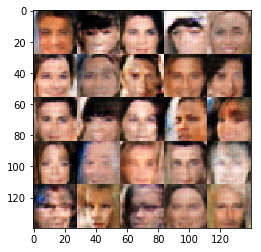

Epoch 4/5... Discriminator Loss: 1.3719... Generator Loss: 0.8074
Epoch 4/5... Discriminator Loss: 1.3729... Generator Loss: 0.8082
Epoch 4/5... Discriminator Loss: 1.3711... Generator Loss: 0.7999
Epoch 4/5... Discriminator Loss: 1.3789... Generator Loss: 0.8273
Epoch 4/5... Discriminator Loss: 1.3658... Generator Loss: 0.9324
Epoch 4/5... Discriminator Loss: 1.3726... Generator Loss: 0.7985
Epoch 4/5... Discriminator Loss: 1.3805... Generator Loss: 0.8008
Epoch 4/5... Discriminator Loss: 1.3722... Generator Loss: 0.7786
Epoch 4/5... Discriminator Loss: 1.3780... Generator Loss: 0.8105
Epoch 4/5... Discriminator Loss: 1.3697... Generator Loss: 0.8048


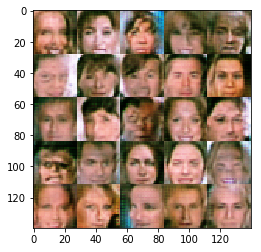

Epoch 4/5... Discriminator Loss: 1.3746... Generator Loss: 0.7952
Epoch 4/5... Discriminator Loss: 1.3738... Generator Loss: 0.8133
Epoch 4/5... Discriminator Loss: 1.3670... Generator Loss: 0.8824
Epoch 4/5... Discriminator Loss: 1.3682... Generator Loss: 0.8122
Epoch 4/5... Discriminator Loss: 1.3755... Generator Loss: 0.8025
Epoch 4/5... Discriminator Loss: 1.3739... Generator Loss: 0.7863
Epoch 4/5... Discriminator Loss: 1.3729... Generator Loss: 0.8245
Epoch 4/5... Discriminator Loss: 1.3795... Generator Loss: 0.7844
Epoch 4/5... Discriminator Loss: 1.3727... Generator Loss: 0.7971
Epoch 4/5... Discriminator Loss: 1.3744... Generator Loss: 0.7945


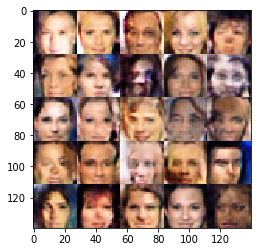

Epoch 4/5... Discriminator Loss: 1.3736... Generator Loss: 0.8040
Epoch 4/5... Discriminator Loss: 1.3742... Generator Loss: 0.8038
Epoch 4/5... Discriminator Loss: 1.3697... Generator Loss: 0.8050
Epoch 4/5... Discriminator Loss: 1.3752... Generator Loss: 0.7951
Epoch 4/5... Discriminator Loss: 1.3747... Generator Loss: 0.7981
Epoch 4/5... Discriminator Loss: 1.3781... Generator Loss: 0.7972
Epoch 4/5... Discriminator Loss: 1.3775... Generator Loss: 0.8011
Epoch 4/5... Discriminator Loss: 1.3714... Generator Loss: 0.8041
Epoch 4/5... Discriminator Loss: 1.3732... Generator Loss: 0.8146
Epoch 4/5... Discriminator Loss: 1.3653... Generator Loss: 0.7461


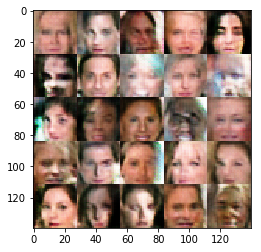

Epoch 4/5... Discriminator Loss: 1.3758... Generator Loss: 0.8073
Epoch 4/5... Discriminator Loss: 1.3741... Generator Loss: 0.8043
Epoch 4/5... Discriminator Loss: 1.3762... Generator Loss: 0.7971
Epoch 4/5... Discriminator Loss: 1.3714... Generator Loss: 0.8048
Epoch 4/5... Discriminator Loss: 1.3732... Generator Loss: 0.8021
Epoch 4/5... Discriminator Loss: 1.3743... Generator Loss: 0.7959
Epoch 4/5... Discriminator Loss: 1.3691... Generator Loss: 0.8069
Epoch 4/5... Discriminator Loss: 1.3704... Generator Loss: 0.8007
Epoch 4/5... Discriminator Loss: 1.3749... Generator Loss: 0.8048
Epoch 4/5... Discriminator Loss: 1.3715... Generator Loss: 0.8006


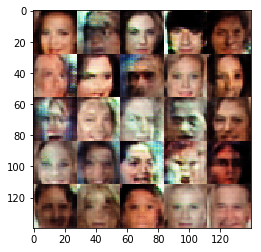

Epoch 4/5... Discriminator Loss: 1.3721... Generator Loss: 0.7905
Epoch 4/5... Discriminator Loss: 1.3759... Generator Loss: 0.7888
Epoch 4/5... Discriminator Loss: 1.3729... Generator Loss: 0.7986
Epoch 4/5... Discriminator Loss: 1.3732... Generator Loss: 0.8016
Epoch 4/5... Discriminator Loss: 1.3791... Generator Loss: 0.7959
Epoch 4/5... Discriminator Loss: 1.3724... Generator Loss: 0.7971
Epoch 4/5... Discriminator Loss: 1.3767... Generator Loss: 0.7936
Epoch 4/5... Discriminator Loss: 1.3730... Generator Loss: 0.8030
Epoch 4/5... Discriminator Loss: 1.3729... Generator Loss: 0.7988
Epoch 4/5... Discriminator Loss: 1.3731... Generator Loss: 0.7993


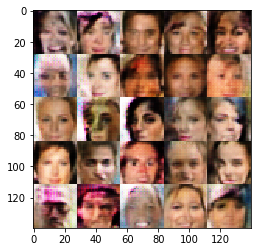

Epoch 4/5... Discriminator Loss: 1.3745... Generator Loss: 0.8023
Epoch 4/5... Discriminator Loss: 1.3727... Generator Loss: 0.8048
Epoch 4/5... Discriminator Loss: 1.3700... Generator Loss: 0.8094
Epoch 4/5... Discriminator Loss: 1.3705... Generator Loss: 0.8026
Epoch 4/5... Discriminator Loss: 1.3711... Generator Loss: 0.7956
Epoch 4/5... Discriminator Loss: 1.3732... Generator Loss: 0.7925
Epoch 4/5... Discriminator Loss: 1.3766... Generator Loss: 0.8031
Epoch 4/5... Discriminator Loss: 1.3678... Generator Loss: 0.8007
Epoch 4/5... Discriminator Loss: 1.3678... Generator Loss: 0.8147
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.8041


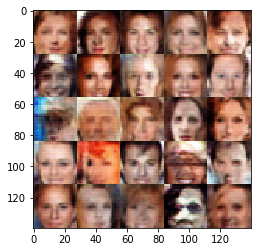

Epoch 4/5... Discriminator Loss: 1.3750... Generator Loss: 0.7915
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.8012
Epoch 4/5... Discriminator Loss: 1.3737... Generator Loss: 0.7919
Epoch 4/5... Discriminator Loss: 1.3771... Generator Loss: 0.8052
Epoch 4/5... Discriminator Loss: 1.3718... Generator Loss: 0.7992
Epoch 4/5... Discriminator Loss: 1.3778... Generator Loss: 0.7979
Epoch 4/5... Discriminator Loss: 1.3729... Generator Loss: 0.8009
Epoch 4/5... Discriminator Loss: 1.3746... Generator Loss: 0.8004
Epoch 4/5... Discriminator Loss: 1.3771... Generator Loss: 0.7913
Epoch 4/5... Discriminator Loss: 1.3772... Generator Loss: 0.7907


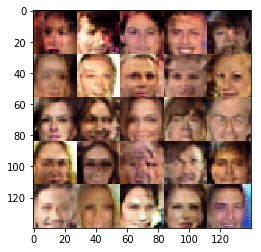

Epoch 4/5... Discriminator Loss: 1.3739... Generator Loss: 0.8023
Epoch 4/5... Discriminator Loss: 1.3768... Generator Loss: 0.7980
Epoch 4/5... Discriminator Loss: 1.3746... Generator Loss: 0.8023
Epoch 4/5... Discriminator Loss: 1.3737... Generator Loss: 0.8103
Epoch 4/5... Discriminator Loss: 1.3711... Generator Loss: 0.7998
Epoch 4/5... Discriminator Loss: 1.3709... Generator Loss: 0.8160
Epoch 4/5... Discriminator Loss: 1.3738... Generator Loss: 0.8027
Epoch 4/5... Discriminator Loss: 1.3734... Generator Loss: 0.8029
Epoch 4/5... Discriminator Loss: 1.3793... Generator Loss: 0.7963
Epoch 4/5... Discriminator Loss: 1.3739... Generator Loss: 0.7979


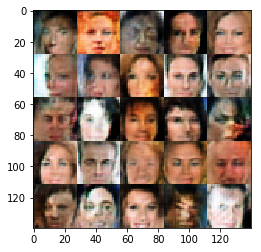

Epoch 4/5... Discriminator Loss: 1.3767... Generator Loss: 0.7964
Epoch 4/5... Discriminator Loss: 1.3758... Generator Loss: 0.7992
Epoch 4/5... Discriminator Loss: 1.3746... Generator Loss: 0.7998
Epoch 4/5... Discriminator Loss: 1.3763... Generator Loss: 0.7919
Epoch 4/5... Discriminator Loss: 1.3732... Generator Loss: 0.8253
Epoch 4/5... Discriminator Loss: 1.3755... Generator Loss: 0.8118
Epoch 4/5... Discriminator Loss: 1.3724... Generator Loss: 0.7957
Epoch 4/5... Discriminator Loss: 1.3761... Generator Loss: 0.7977
Epoch 4/5... Discriminator Loss: 1.3750... Generator Loss: 0.8045
Epoch 4/5... Discriminator Loss: 1.3746... Generator Loss: 0.8036


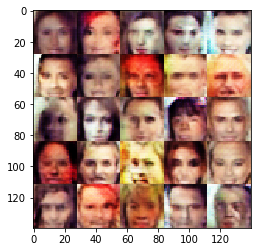

Epoch 4/5... Discriminator Loss: 1.3730... Generator Loss: 0.8033
Epoch 4/5... Discriminator Loss: 1.3741... Generator Loss: 0.8016
Epoch 4/5... Discriminator Loss: 1.3734... Generator Loss: 0.8066
Epoch 4/5... Discriminator Loss: 1.3729... Generator Loss: 0.8045
Epoch 4/5... Discriminator Loss: 1.3752... Generator Loss: 0.7957
Epoch 4/5... Discriminator Loss: 1.3932... Generator Loss: 0.9633
Epoch 4/5... Discriminator Loss: 1.3688... Generator Loss: 0.8058
Epoch 4/5... Discriminator Loss: 1.3762... Generator Loss: 0.7991
Epoch 4/5... Discriminator Loss: 1.3765... Generator Loss: 0.8036
Epoch 4/5... Discriminator Loss: 1.3755... Generator Loss: 0.8001


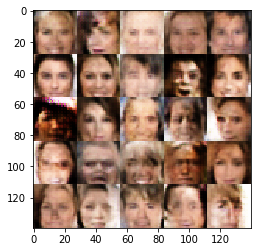

Epoch 4/5... Discriminator Loss: 1.3771... Generator Loss: 0.7972
Epoch 4/5... Discriminator Loss: 1.3628... Generator Loss: 0.8279
Epoch 4/5... Discriminator Loss: 1.3739... Generator Loss: 0.8109
Epoch 4/5... Discriminator Loss: 1.3760... Generator Loss: 0.7958
Epoch 4/5... Discriminator Loss: 1.3730... Generator Loss: 0.7985
Epoch 4/5... Discriminator Loss: 1.3749... Generator Loss: 0.8031
Epoch 4/5... Discriminator Loss: 1.3737... Generator Loss: 0.8005
Epoch 4/5... Discriminator Loss: 1.3743... Generator Loss: 0.7977
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.7987
Epoch 4/5... Discriminator Loss: 1.3749... Generator Loss: 0.8057


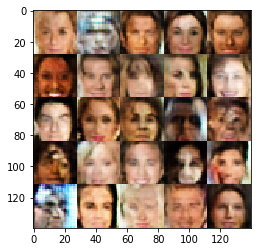

Epoch 4/5... Discriminator Loss: 1.3752... Generator Loss: 0.8023
Epoch 4/5... Discriminator Loss: 1.3759... Generator Loss: 0.8019
Epoch 4/5... Discriminator Loss: 1.3849... Generator Loss: 0.6855
Epoch 4/5... Discriminator Loss: 1.3720... Generator Loss: 0.8006
Epoch 4/5... Discriminator Loss: 1.3729... Generator Loss: 0.8015
Epoch 4/5... Discriminator Loss: 1.3743... Generator Loss: 0.7990
Epoch 4/5... Discriminator Loss: 1.3784... Generator Loss: 0.7962
Epoch 4/5... Discriminator Loss: 1.3776... Generator Loss: 0.7959
Epoch 4/5... Discriminator Loss: 1.3759... Generator Loss: 0.8041
Epoch 4/5... Discriminator Loss: 1.3812... Generator Loss: 0.7055


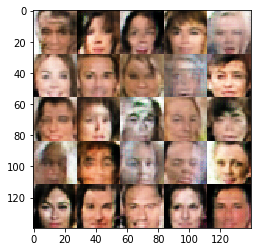

Epoch 4/5... Discriminator Loss: 1.3752... Generator Loss: 0.8020
Epoch 4/5... Discriminator Loss: 1.3752... Generator Loss: 0.7967
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.7959
Epoch 4/5... Discriminator Loss: 1.3761... Generator Loss: 0.7986
Epoch 4/5... Discriminator Loss: 1.3751... Generator Loss: 0.7957
Epoch 4/5... Discriminator Loss: 1.3763... Generator Loss: 0.7748
Epoch 4/5... Discriminator Loss: 1.3722... Generator Loss: 0.8026
Epoch 4/5... Discriminator Loss: 1.3757... Generator Loss: 0.8065
Epoch 4/5... Discriminator Loss: 1.3745... Generator Loss: 0.8028
Epoch 4/5... Discriminator Loss: 1.3727... Generator Loss: 0.7969


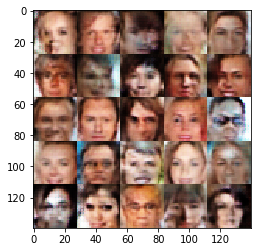

Epoch 4/5... Discriminator Loss: 1.3724... Generator Loss: 0.8017
Epoch 4/5... Discriminator Loss: 1.3679... Generator Loss: 0.8154
Epoch 4/5... Discriminator Loss: 1.3766... Generator Loss: 0.7996
Epoch 4/5... Discriminator Loss: 1.3753... Generator Loss: 0.8040
Epoch 4/5... Discriminator Loss: 1.3747... Generator Loss: 0.8014
Epoch 4/5... Discriminator Loss: 1.3746... Generator Loss: 0.8026
Epoch 4/5... Discriminator Loss: 1.3757... Generator Loss: 0.7999
Epoch 4/5... Discriminator Loss: 1.3769... Generator Loss: 0.7788
Epoch 4/5... Discriminator Loss: 1.3767... Generator Loss: 0.7923
Epoch 4/5... Discriminator Loss: 1.3744... Generator Loss: 0.8014


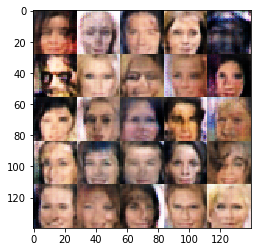

Epoch 4/5... Discriminator Loss: 1.3748... Generator Loss: 0.8013
Epoch 4/5... Discriminator Loss: 1.3761... Generator Loss: 0.7982
Epoch 4/5... Discriminator Loss: 1.3774... Generator Loss: 0.7943
Epoch 4/5... Discriminator Loss: 1.3743... Generator Loss: 0.7985
Epoch 4/5... Discriminator Loss: 1.3802... Generator Loss: 0.8060
Epoch 4/5... Discriminator Loss: 1.3758... Generator Loss: 0.7982
Epoch 4/5... Discriminator Loss: 1.3762... Generator Loss: 0.7952
Epoch 4/5... Discriminator Loss: 1.3775... Generator Loss: 0.7949
Epoch 4/5... Discriminator Loss: 1.3754... Generator Loss: 0.7902
Epoch 4/5... Discriminator Loss: 1.3727... Generator Loss: 0.8012


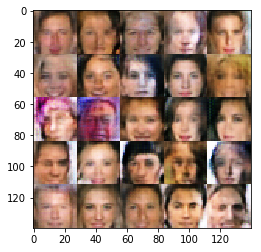

Epoch 4/5... Discriminator Loss: 1.3757... Generator Loss: 0.7982
Epoch 4/5... Discriminator Loss: 1.3750... Generator Loss: 0.7664
Epoch 4/5... Discriminator Loss: 1.3757... Generator Loss: 0.7991
Epoch 4/5... Discriminator Loss: 1.3734... Generator Loss: 0.7963
Epoch 4/5... Discriminator Loss: 1.3743... Generator Loss: 0.7965
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.8109
Epoch 4/5... Discriminator Loss: 1.3760... Generator Loss: 0.7926
Epoch 4/5... Discriminator Loss: 1.3771... Generator Loss: 0.7866
Epoch 4/5... Discriminator Loss: 1.3877... Generator Loss: 0.6795
Epoch 4/5... Discriminator Loss: 1.3775... Generator Loss: 0.8006


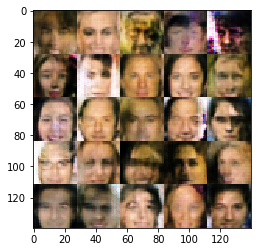

Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.9156
Epoch 4/5... Discriminator Loss: 1.3748... Generator Loss: 0.8061
Epoch 4/5... Discriminator Loss: 1.3745... Generator Loss: 0.7987
Epoch 4/5... Discriminator Loss: 1.3780... Generator Loss: 0.8045
Epoch 4/5... Discriminator Loss: 1.3753... Generator Loss: 0.8019
Epoch 4/5... Discriminator Loss: 1.3715... Generator Loss: 0.7995
Epoch 4/5... Discriminator Loss: 1.3745... Generator Loss: 0.8006
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.8068
Epoch 4/5... Discriminator Loss: 1.3759... Generator Loss: 0.8020
Epoch 4/5... Discriminator Loss: 1.3737... Generator Loss: 0.8023


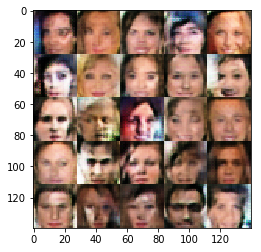

Epoch 4/5... Discriminator Loss: 1.3750... Generator Loss: 0.7973
Epoch 4/5... Discriminator Loss: 1.3773... Generator Loss: 0.8532
Epoch 4/5... Discriminator Loss: 1.3684... Generator Loss: 0.8014
Epoch 4/5... Discriminator Loss: 1.3788... Generator Loss: 0.7940
Epoch 4/5... Discriminator Loss: 1.3720... Generator Loss: 0.8031
Epoch 4/5... Discriminator Loss: 1.3745... Generator Loss: 0.7996
Epoch 4/5... Discriminator Loss: 1.3718... Generator Loss: 0.7969
Epoch 4/5... Discriminator Loss: 1.3724... Generator Loss: 0.8029
Epoch 4/5... Discriminator Loss: 1.3641... Generator Loss: 0.7771
Epoch 4/5... Discriminator Loss: 1.3741... Generator Loss: 0.8061


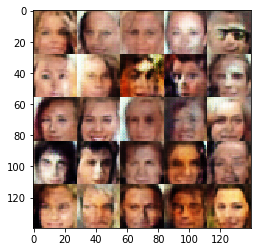

Epoch 4/5... Discriminator Loss: 1.3708... Generator Loss: 0.7976
Epoch 4/5... Discriminator Loss: 1.3730... Generator Loss: 0.8059
Epoch 4/5... Discriminator Loss: 1.3759... Generator Loss: 0.7984
Epoch 4/5... Discriminator Loss: 1.3757... Generator Loss: 0.8024
Epoch 4/5... Discriminator Loss: 1.3747... Generator Loss: 0.8044
Epoch 4/5... Discriminator Loss: 1.3720... Generator Loss: 0.8016
Epoch 4/5... Discriminator Loss: 1.3782... Generator Loss: 0.8102
Epoch 4/5... Discriminator Loss: 1.3718... Generator Loss: 0.8029
Epoch 4/5... Discriminator Loss: 1.3754... Generator Loss: 0.8034
Epoch 4/5... Discriminator Loss: 1.3715... Generator Loss: 0.7993


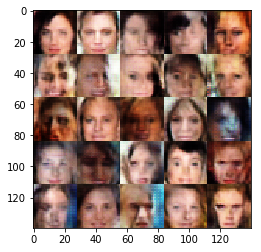

Epoch 4/5... Discriminator Loss: 1.3716... Generator Loss: 0.8111
Epoch 4/5... Discriminator Loss: 1.3744... Generator Loss: 0.7926
Epoch 4/5... Discriminator Loss: 1.3737... Generator Loss: 0.7994
Epoch 4/5... Discriminator Loss: 1.3750... Generator Loss: 0.7984
Epoch 4/5... Discriminator Loss: 1.3731... Generator Loss: 0.8038
Epoch 4/5... Discriminator Loss: 1.3764... Generator Loss: 0.8182
Epoch 4/5... Discriminator Loss: 1.3738... Generator Loss: 0.8139
Epoch 4/5... Discriminator Loss: 1.3640... Generator Loss: 0.8227
Epoch 4/5... Discriminator Loss: 1.3749... Generator Loss: 0.7936
Epoch 4/5... Discriminator Loss: 1.3660... Generator Loss: 0.7944


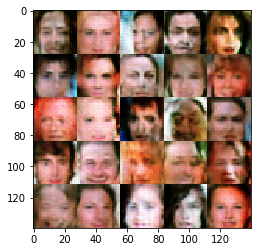

Epoch 4/5... Discriminator Loss: 1.3725... Generator Loss: 0.8095
Epoch 4/5... Discriminator Loss: 1.3754... Generator Loss: 0.7892
Epoch 4/5... Discriminator Loss: 1.3768... Generator Loss: 0.7847
Epoch 4/5... Discriminator Loss: 1.3717... Generator Loss: 0.8030
Epoch 4/5... Discriminator Loss: 1.3757... Generator Loss: 0.7994
Epoch 4/5... Discriminator Loss: 1.3764... Generator Loss: 0.8049
Epoch 4/5... Discriminator Loss: 1.3744... Generator Loss: 0.8001
Epoch 4/5... Discriminator Loss: 1.3718... Generator Loss: 0.8024
Epoch 4/5... Discriminator Loss: 1.3768... Generator Loss: 0.8004
Epoch 4/5... Discriminator Loss: 1.3765... Generator Loss: 0.8006


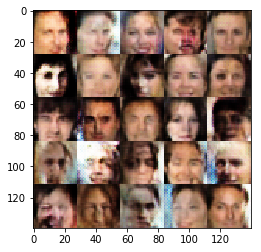

Epoch 4/5... Discriminator Loss: 1.3748... Generator Loss: 0.8007
Epoch 4/5... Discriminator Loss: 1.3723... Generator Loss: 0.7845
Epoch 4/5... Discriminator Loss: 1.3741... Generator Loss: 0.7886
Epoch 4/5... Discriminator Loss: 1.3748... Generator Loss: 0.7966
Epoch 4/5... Discriminator Loss: 1.3721... Generator Loss: 0.8111
Epoch 4/5... Discriminator Loss: 1.3773... Generator Loss: 0.7980
Epoch 4/5... Discriminator Loss: 1.3774... Generator Loss: 0.7953
Epoch 4/5... Discriminator Loss: 1.3771... Generator Loss: 0.7978
Epoch 4/5... Discriminator Loss: 1.3726... Generator Loss: 0.7990
Epoch 4/5... Discriminator Loss: 1.3768... Generator Loss: 0.7950


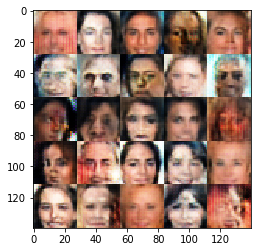

Epoch 4/5... Discriminator Loss: 1.3736... Generator Loss: 0.7970
Epoch 4/5... Discriminator Loss: 1.3748... Generator Loss: 0.8048
Epoch 4/5... Discriminator Loss: 1.3691... Generator Loss: 0.8030
Epoch 4/5... Discriminator Loss: 1.3664... Generator Loss: 0.8221
Epoch 4/5... Discriminator Loss: 1.3759... Generator Loss: 0.7946
Epoch 4/5... Discriminator Loss: 1.3744... Generator Loss: 0.7965
Epoch 4/5... Discriminator Loss: 1.3767... Generator Loss: 0.8005
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.8003
Epoch 4/5... Discriminator Loss: 1.3780... Generator Loss: 0.7999
Epoch 4/5... Discriminator Loss: 1.3706... Generator Loss: 0.7383


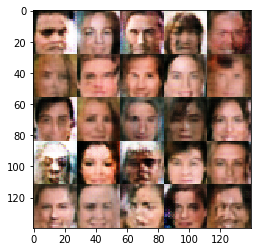

Epoch 4/5... Discriminator Loss: 1.3757... Generator Loss: 0.8208
Epoch 4/5... Discriminator Loss: 1.3728... Generator Loss: 0.7971
Epoch 4/5... Discriminator Loss: 1.3776... Generator Loss: 0.7991
Epoch 4/5... Discriminator Loss: 1.3754... Generator Loss: 0.8083
Epoch 4/5... Discriminator Loss: 1.3775... Generator Loss: 0.7996
Epoch 4/5... Discriminator Loss: 1.3721... Generator Loss: 0.8022
Epoch 4/5... Discriminator Loss: 1.3736... Generator Loss: 0.7953
Epoch 4/5... Discriminator Loss: 1.3687... Generator Loss: 0.8000
Epoch 4/5... Discriminator Loss: 1.3763... Generator Loss: 0.7337
Epoch 4/5... Discriminator Loss: 1.3609... Generator Loss: 0.8059


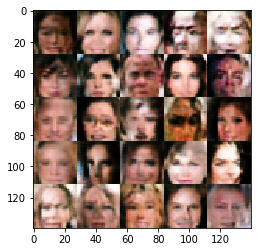

Epoch 4/5... Discriminator Loss: 1.3755... Generator Loss: 0.7952
Epoch 4/5... Discriminator Loss: 1.3742... Generator Loss: 0.8056
Epoch 4/5... Discriminator Loss: 1.3763... Generator Loss: 0.7965
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.8040
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.7994
Epoch 4/5... Discriminator Loss: 1.3764... Generator Loss: 0.8354
Epoch 4/5... Discriminator Loss: 1.3674... Generator Loss: 0.7709
Epoch 4/5... Discriminator Loss: 1.3705... Generator Loss: 0.8039
Epoch 4/5... Discriminator Loss: 1.3796... Generator Loss: 0.7962
Epoch 4/5... Discriminator Loss: 1.3731... Generator Loss: 0.7998


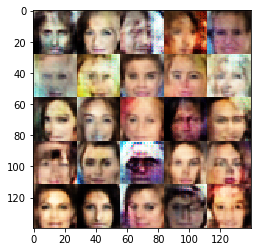

Epoch 4/5... Discriminator Loss: 1.3761... Generator Loss: 0.7975
Epoch 4/5... Discriminator Loss: 1.3736... Generator Loss: 0.7997
Epoch 4/5... Discriminator Loss: 1.3702... Generator Loss: 0.8429
Epoch 4/5... Discriminator Loss: 1.3740... Generator Loss: 0.8020
Epoch 4/5... Discriminator Loss: 1.3760... Generator Loss: 0.8009
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.7999
Epoch 4/5... Discriminator Loss: 1.3741... Generator Loss: 0.7977
Epoch 4/5... Discriminator Loss: 1.3763... Generator Loss: 0.7992
Epoch 4/5... Discriminator Loss: 1.3760... Generator Loss: 0.7981
Epoch 4/5... Discriminator Loss: 1.3763... Generator Loss: 0.8012


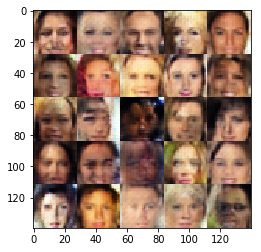

Epoch 4/5... Discriminator Loss: 1.3751... Generator Loss: 0.7969
Epoch 4/5... Discriminator Loss: 1.3763... Generator Loss: 0.7963
Epoch 4/5... Discriminator Loss: 1.3751... Generator Loss: 0.7982
Epoch 4/5... Discriminator Loss: 1.3748... Generator Loss: 0.7975
Epoch 4/5... Discriminator Loss: 1.3725... Generator Loss: 0.7989
Epoch 4/5... Discriminator Loss: 1.3734... Generator Loss: 0.7952
Epoch 4/5... Discriminator Loss: 1.3704... Generator Loss: 0.7886
Epoch 4/5... Discriminator Loss: 1.3762... Generator Loss: 0.8018
Epoch 4/5... Discriminator Loss: 1.3786... Generator Loss: 0.7913
Epoch 4/5... Discriminator Loss: 1.3757... Generator Loss: 0.8007


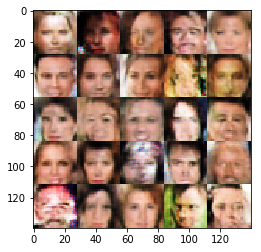

Epoch 4/5... Discriminator Loss: 1.3759... Generator Loss: 0.8004
Epoch 4/5... Discriminator Loss: 1.3761... Generator Loss: 0.8013
Epoch 4/5... Discriminator Loss: 1.3758... Generator Loss: 0.8009
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.7999
Epoch 4/5... Discriminator Loss: 1.3753... Generator Loss: 0.7908
Epoch 4/5... Discriminator Loss: 1.3761... Generator Loss: 0.7955
Epoch 4/5... Discriminator Loss: 1.3735... Generator Loss: 0.8005
Epoch 4/5... Discriminator Loss: 1.3722... Generator Loss: 0.7999
Epoch 4/5... Discriminator Loss: 1.3728... Generator Loss: 0.8037
Epoch 4/5... Discriminator Loss: 1.3717... Generator Loss: 0.7994


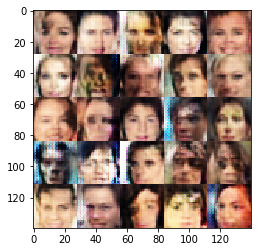

Epoch 4/5... Discriminator Loss: 1.3748... Generator Loss: 0.8010
Epoch 4/5... Discriminator Loss: 1.3757... Generator Loss: 0.8007
Epoch 4/5... Discriminator Loss: 1.3663... Generator Loss: 0.7955
Epoch 4/5... Discriminator Loss: 1.3751... Generator Loss: 0.8084
Epoch 4/5... Discriminator Loss: 1.3729... Generator Loss: 0.8009
Epoch 4/5... Discriminator Loss: 1.3761... Generator Loss: 0.8021
Epoch 4/5... Discriminator Loss: 1.3756... Generator Loss: 0.7970
Epoch 4/5... Discriminator Loss: 1.3731... Generator Loss: 0.8030
Epoch 4/5... Discriminator Loss: 1.3728... Generator Loss: 0.7894
Epoch 4/5... Discriminator Loss: 1.3701... Generator Loss: 0.8463


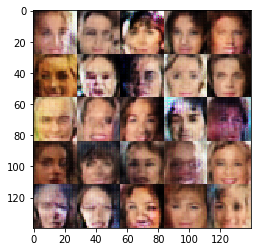

Epoch 4/5... Discriminator Loss: 1.3737... Generator Loss: 0.8101
Epoch 4/5... Discriminator Loss: 1.3746... Generator Loss: 0.8001
Epoch 4/5... Discriminator Loss: 1.3761... Generator Loss: 0.8040
Epoch 4/5... Discriminator Loss: 1.3722... Generator Loss: 0.8083
Epoch 4/5... Discriminator Loss: 1.3704... Generator Loss: 0.8018
Epoch 4/5... Discriminator Loss: 1.3674... Generator Loss: 0.7163
Epoch 4/5... Discriminator Loss: 1.3750... Generator Loss: 0.8008
Epoch 4/5... Discriminator Loss: 1.3757... Generator Loss: 0.7996
Epoch 4/5... Discriminator Loss: 1.3668... Generator Loss: 0.7930
Epoch 4/5... Discriminator Loss: 1.3708... Generator Loss: 0.8195


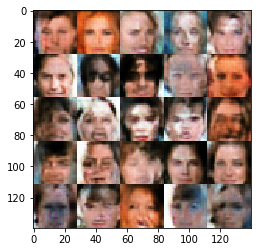

Epoch 4/5... Discriminator Loss: 1.3715... Generator Loss: 0.7983
Epoch 4/5... Discriminator Loss: 1.3729... Generator Loss: 0.7983
Epoch 4/5... Discriminator Loss: 1.3699... Generator Loss: 0.8029
Epoch 4/5... Discriminator Loss: 1.3748... Generator Loss: 0.7947
Epoch 4/5... Discriminator Loss: 1.3735... Generator Loss: 0.7973
Epoch 4/5... Discriminator Loss: 1.3737... Generator Loss: 0.8010
Epoch 4/5... Discriminator Loss: 1.3737... Generator Loss: 0.8055
Epoch 4/5... Discriminator Loss: 1.3695... Generator Loss: 0.8005
Epoch 4/5... Discriminator Loss: 1.3766... Generator Loss: 0.7966
Epoch 4/5... Discriminator Loss: 1.3749... Generator Loss: 0.7984


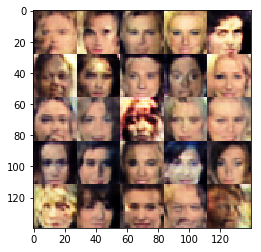

Epoch 4/5... Discriminator Loss: 1.3711... Generator Loss: 0.7944
Epoch 4/5... Discriminator Loss: 1.3741... Generator Loss: 0.8053
Epoch 4/5... Discriminator Loss: 1.3735... Generator Loss: 0.8010
Epoch 4/5... Discriminator Loss: 1.3749... Generator Loss: 0.7984
Epoch 4/5... Discriminator Loss: 1.3729... Generator Loss: 0.7966
Epoch 4/5... Discriminator Loss: 1.3636... Generator Loss: 0.8030
Epoch 5/5... Discriminator Loss: 1.3717... Generator Loss: 0.7967
Epoch 5/5... Discriminator Loss: 1.3739... Generator Loss: 0.7970
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.8005
Epoch 5/5... Discriminator Loss: 1.3771... Generator Loss: 0.7919


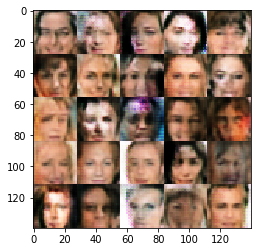

Epoch 5/5... Discriminator Loss: 1.3754... Generator Loss: 0.8012
Epoch 5/5... Discriminator Loss: 1.3730... Generator Loss: 0.8011
Epoch 5/5... Discriminator Loss: 1.3720... Generator Loss: 0.8001
Epoch 5/5... Discriminator Loss: 1.3745... Generator Loss: 0.7993
Epoch 5/5... Discriminator Loss: 1.3747... Generator Loss: 0.7982
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.7922
Epoch 5/5... Discriminator Loss: 1.3738... Generator Loss: 0.7992
Epoch 5/5... Discriminator Loss: 1.3758... Generator Loss: 0.7999
Epoch 5/5... Discriminator Loss: 1.3736... Generator Loss: 0.8009
Epoch 5/5... Discriminator Loss: 1.3759... Generator Loss: 0.7987


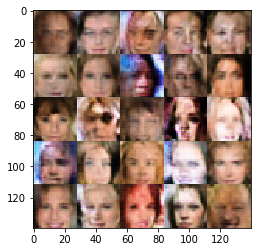

Epoch 5/5... Discriminator Loss: 1.3751... Generator Loss: 0.7991
Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.8003
Epoch 5/5... Discriminator Loss: 1.3755... Generator Loss: 0.8000
Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.8006
Epoch 5/5... Discriminator Loss: 1.3763... Generator Loss: 0.8096
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.8040
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.7978
Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.7949
Epoch 5/5... Discriminator Loss: 1.3761... Generator Loss: 0.7962
Epoch 5/5... Discriminator Loss: 1.3754... Generator Loss: 0.7971


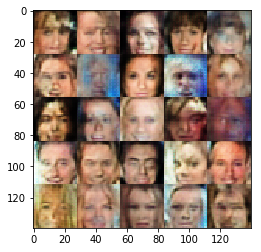

Epoch 5/5... Discriminator Loss: 1.3769... Generator Loss: 0.7983
Epoch 5/5... Discriminator Loss: 1.3766... Generator Loss: 0.7972
Epoch 5/5... Discriminator Loss: 1.3698... Generator Loss: 0.8024
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.7972
Epoch 5/5... Discriminator Loss: 1.3684... Generator Loss: 0.8309
Epoch 5/5... Discriminator Loss: 1.3712... Generator Loss: 0.7883
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.7984
Epoch 5/5... Discriminator Loss: 1.3766... Generator Loss: 0.8003
Epoch 5/5... Discriminator Loss: 1.3743... Generator Loss: 0.8011
Epoch 5/5... Discriminator Loss: 1.3665... Generator Loss: 0.8117


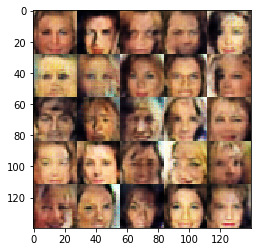

Epoch 5/5... Discriminator Loss: 1.3751... Generator Loss: 0.7968
Epoch 5/5... Discriminator Loss: 1.3773... Generator Loss: 0.7797
Epoch 5/5... Discriminator Loss: 1.3743... Generator Loss: 0.8006
Epoch 5/5... Discriminator Loss: 1.3746... Generator Loss: 0.8045
Epoch 5/5... Discriminator Loss: 1.3745... Generator Loss: 0.7974
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.7957
Epoch 5/5... Discriminator Loss: 1.3753... Generator Loss: 0.7969
Epoch 5/5... Discriminator Loss: 1.3748... Generator Loss: 0.7990
Epoch 5/5... Discriminator Loss: 1.3773... Generator Loss: 0.8076
Epoch 5/5... Discriminator Loss: 1.3739... Generator Loss: 0.7741


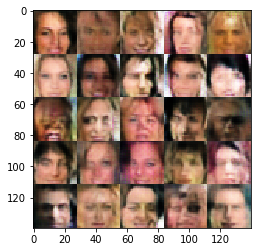

Epoch 5/5... Discriminator Loss: 1.3733... Generator Loss: 0.8024
Epoch 5/5... Discriminator Loss: 1.3742... Generator Loss: 0.7991
Epoch 5/5... Discriminator Loss: 1.3748... Generator Loss: 0.8005
Epoch 5/5... Discriminator Loss: 1.3746... Generator Loss: 0.7975
Epoch 5/5... Discriminator Loss: 1.3728... Generator Loss: 0.8019
Epoch 5/5... Discriminator Loss: 1.3754... Generator Loss: 0.8051
Epoch 5/5... Discriminator Loss: 1.3720... Generator Loss: 0.8168
Epoch 5/5... Discriminator Loss: 1.3720... Generator Loss: 0.7896
Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.8042
Epoch 5/5... Discriminator Loss: 1.3776... Generator Loss: 0.7888


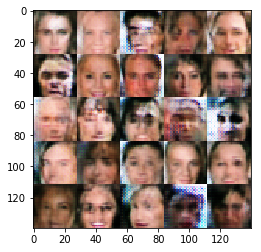

Epoch 5/5... Discriminator Loss: 1.3755... Generator Loss: 0.7963
Epoch 5/5... Discriminator Loss: 1.3740... Generator Loss: 0.7916
Epoch 5/5... Discriminator Loss: 1.3707... Generator Loss: 0.8186
Epoch 5/5... Discriminator Loss: 1.3753... Generator Loss: 0.7854
Epoch 5/5... Discriminator Loss: 1.3765... Generator Loss: 0.8019
Epoch 5/5... Discriminator Loss: 1.3764... Generator Loss: 0.8052
Epoch 5/5... Discriminator Loss: 1.3749... Generator Loss: 0.7990
Epoch 5/5... Discriminator Loss: 1.3759... Generator Loss: 0.8042
Epoch 5/5... Discriminator Loss: 1.3758... Generator Loss: 0.7996
Epoch 5/5... Discriminator Loss: 1.3776... Generator Loss: 0.7598


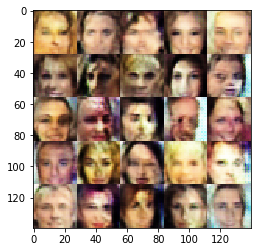

Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.7993
Epoch 5/5... Discriminator Loss: 1.3728... Generator Loss: 0.7849
Epoch 5/5... Discriminator Loss: 1.3742... Generator Loss: 0.7918
Epoch 5/5... Discriminator Loss: 1.3736... Generator Loss: 0.8306
Epoch 5/5... Discriminator Loss: 1.3750... Generator Loss: 0.8051
Epoch 5/5... Discriminator Loss: 1.3750... Generator Loss: 0.7982
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.7986
Epoch 5/5... Discriminator Loss: 1.3733... Generator Loss: 0.7903
Epoch 5/5... Discriminator Loss: 1.3731... Generator Loss: 0.8040
Epoch 5/5... Discriminator Loss: 1.3745... Generator Loss: 0.8003


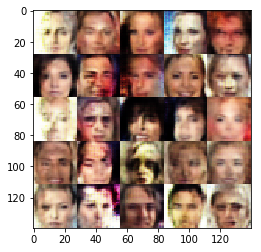

Epoch 5/5... Discriminator Loss: 1.3750... Generator Loss: 0.7975
Epoch 5/5... Discriminator Loss: 1.3774... Generator Loss: 0.7146
Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.8004
Epoch 5/5... Discriminator Loss: 1.3745... Generator Loss: 0.7935
Epoch 5/5... Discriminator Loss: 1.3742... Generator Loss: 0.8018
Epoch 5/5... Discriminator Loss: 1.3758... Generator Loss: 0.7969
Epoch 5/5... Discriminator Loss: 1.3719... Generator Loss: 0.8090
Epoch 5/5... Discriminator Loss: 1.3759... Generator Loss: 0.8058
Epoch 5/5... Discriminator Loss: 1.3707... Generator Loss: 0.7936
Epoch 5/5... Discriminator Loss: 1.3750... Generator Loss: 0.7898


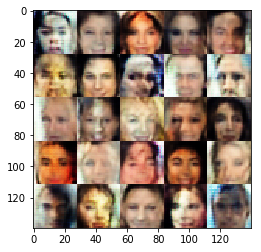

Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.7953
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.7992
Epoch 5/5... Discriminator Loss: 1.3766... Generator Loss: 0.7913
Epoch 5/5... Discriminator Loss: 1.3710... Generator Loss: 0.7998
Epoch 5/5... Discriminator Loss: 1.3734... Generator Loss: 0.7971
Epoch 5/5... Discriminator Loss: 1.3748... Generator Loss: 0.7990
Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.8042
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.7989
Epoch 5/5... Discriminator Loss: 1.3753... Generator Loss: 0.7967
Epoch 5/5... Discriminator Loss: 1.3860... Generator Loss: 0.6906


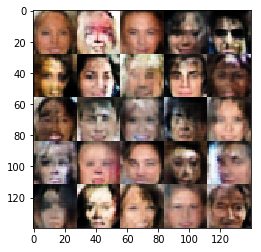

Epoch 5/5... Discriminator Loss: 1.3735... Generator Loss: 0.7954
Epoch 5/5... Discriminator Loss: 1.3754... Generator Loss: 0.7999
Epoch 5/5... Discriminator Loss: 1.3751... Generator Loss: 0.8020
Epoch 5/5... Discriminator Loss: 1.3723... Generator Loss: 0.8235
Epoch 5/5... Discriminator Loss: 1.3762... Generator Loss: 0.7763
Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.8073
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.8083
Epoch 5/5... Discriminator Loss: 1.3763... Generator Loss: 0.8107
Epoch 5/5... Discriminator Loss: 1.3739... Generator Loss: 0.7998
Epoch 5/5... Discriminator Loss: 1.3750... Generator Loss: 0.8353


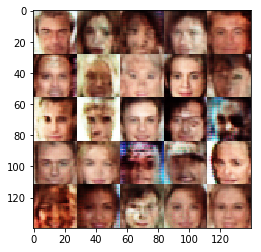

Epoch 5/5... Discriminator Loss: 1.3765... Generator Loss: 0.7982
Epoch 5/5... Discriminator Loss: 1.3759... Generator Loss: 0.7984
Epoch 5/5... Discriminator Loss: 1.3758... Generator Loss: 0.8449
Epoch 5/5... Discriminator Loss: 1.3789... Generator Loss: 0.7792
Epoch 5/5... Discriminator Loss: 1.3704... Generator Loss: 0.7963
Epoch 5/5... Discriminator Loss: 1.3735... Generator Loss: 0.8021
Epoch 5/5... Discriminator Loss: 1.3750... Generator Loss: 0.7978
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.7994
Epoch 5/5... Discriminator Loss: 1.3746... Generator Loss: 0.8001
Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.7984


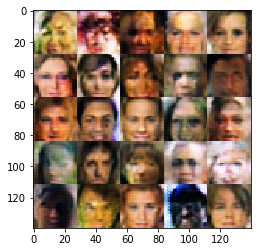

Epoch 5/5... Discriminator Loss: 1.3759... Generator Loss: 0.7997
Epoch 5/5... Discriminator Loss: 1.3769... Generator Loss: 0.7560
Epoch 5/5... Discriminator Loss: 1.3743... Generator Loss: 0.7942
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.8008
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.7973
Epoch 5/5... Discriminator Loss: 1.3787... Generator Loss: 0.8186
Epoch 5/5... Discriminator Loss: 1.3779... Generator Loss: 0.7950
Epoch 5/5... Discriminator Loss: 1.3740... Generator Loss: 0.7971
Epoch 5/5... Discriminator Loss: 1.3729... Generator Loss: 0.8020
Epoch 5/5... Discriminator Loss: 1.3781... Generator Loss: 0.8207


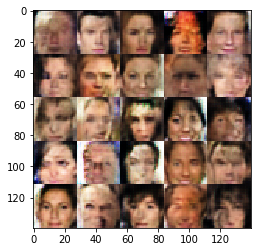

Epoch 5/5... Discriminator Loss: 1.3722... Generator Loss: 0.8039
Epoch 5/5... Discriminator Loss: 1.3742... Generator Loss: 0.7966
Epoch 5/5... Discriminator Loss: 1.3733... Generator Loss: 0.8057
Epoch 5/5... Discriminator Loss: 1.3657... Generator Loss: 0.7999
Epoch 5/5... Discriminator Loss: 1.3753... Generator Loss: 0.7987
Epoch 5/5... Discriminator Loss: 1.3773... Generator Loss: 0.7986
Epoch 5/5... Discriminator Loss: 1.3724... Generator Loss: 0.8012
Epoch 5/5... Discriminator Loss: 1.3759... Generator Loss: 0.7982
Epoch 5/5... Discriminator Loss: 1.3711... Generator Loss: 0.8034
Epoch 5/5... Discriminator Loss: 1.3740... Generator Loss: 0.7973


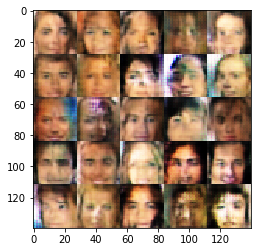

Epoch 5/5... Discriminator Loss: 1.3736... Generator Loss: 0.7964
Epoch 5/5... Discriminator Loss: 1.3741... Generator Loss: 0.8041
Epoch 5/5... Discriminator Loss: 1.3737... Generator Loss: 0.8007
Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.8028
Epoch 5/5... Discriminator Loss: 1.3720... Generator Loss: 0.8171
Epoch 5/5... Discriminator Loss: 1.3705... Generator Loss: 0.8079
Epoch 5/5... Discriminator Loss: 1.3642... Generator Loss: 0.7913
Epoch 5/5... Discriminator Loss: 1.3726... Generator Loss: 0.8016
Epoch 5/5... Discriminator Loss: 1.3793... Generator Loss: 0.8000
Epoch 5/5... Discriminator Loss: 1.3626... Generator Loss: 0.8048


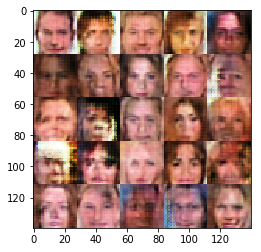

Epoch 5/5... Discriminator Loss: 1.3736... Generator Loss: 0.7967
Epoch 5/5... Discriminator Loss: 1.3728... Generator Loss: 0.8003
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.7973
Epoch 5/5... Discriminator Loss: 1.3741... Generator Loss: 0.8021
Epoch 5/5... Discriminator Loss: 1.3779... Generator Loss: 0.8275
Epoch 5/5... Discriminator Loss: 1.3735... Generator Loss: 0.8068
Epoch 5/5... Discriminator Loss: 1.3740... Generator Loss: 0.7991
Epoch 5/5... Discriminator Loss: 1.3733... Generator Loss: 0.7910
Epoch 5/5... Discriminator Loss: 1.3731... Generator Loss: 0.7974
Epoch 5/5... Discriminator Loss: 1.3762... Generator Loss: 0.8027


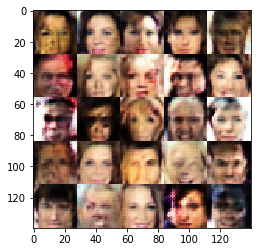

Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.7989
Epoch 5/5... Discriminator Loss: 1.3744... Generator Loss: 0.7995
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.7979
Epoch 5/5... Discriminator Loss: 1.3740... Generator Loss: 0.7883
Epoch 5/5... Discriminator Loss: 1.3750... Generator Loss: 0.8003
Epoch 5/5... Discriminator Loss: 1.3767... Generator Loss: 0.8186
Epoch 5/5... Discriminator Loss: 1.3743... Generator Loss: 0.8029
Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.8021
Epoch 5/5... Discriminator Loss: 1.3761... Generator Loss: 0.7961
Epoch 5/5... Discriminator Loss: 1.3747... Generator Loss: 0.7986


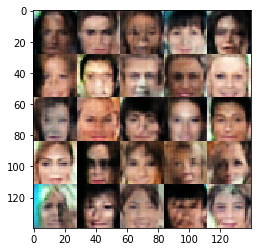

Epoch 5/5... Discriminator Loss: 1.3764... Generator Loss: 0.7964
Epoch 5/5... Discriminator Loss: 1.3734... Generator Loss: 0.8006
Epoch 5/5... Discriminator Loss: 1.3844... Generator Loss: 0.7045
Epoch 5/5... Discriminator Loss: 1.3727... Generator Loss: 0.7990
Epoch 5/5... Discriminator Loss: 1.3683... Generator Loss: 0.7983
Epoch 5/5... Discriminator Loss: 1.3637... Generator Loss: 0.7593
Epoch 5/5... Discriminator Loss: 1.3804... Generator Loss: 0.8003
Epoch 5/5... Discriminator Loss: 1.3765... Generator Loss: 0.8049
Epoch 5/5... Discriminator Loss: 1.3742... Generator Loss: 0.8014
Epoch 5/5... Discriminator Loss: 1.3753... Generator Loss: 0.7987


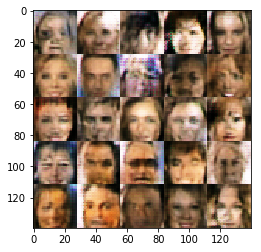

Epoch 5/5... Discriminator Loss: 1.3740... Generator Loss: 0.8058
Epoch 5/5... Discriminator Loss: 1.3735... Generator Loss: 0.8021
Epoch 5/5... Discriminator Loss: 1.3737... Generator Loss: 0.8033
Epoch 5/5... Discriminator Loss: 1.3743... Generator Loss: 0.8026
Epoch 5/5... Discriminator Loss: 1.3719... Generator Loss: 0.7995
Epoch 5/5... Discriminator Loss: 1.3737... Generator Loss: 0.8035
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.8018
Epoch 5/5... Discriminator Loss: 1.3759... Generator Loss: 0.7995
Epoch 5/5... Discriminator Loss: 1.3769... Generator Loss: 0.7712
Epoch 5/5... Discriminator Loss: 1.3769... Generator Loss: 0.8075


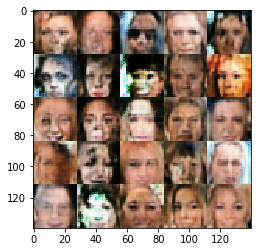

Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.7952
Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.8036
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.7879
Epoch 5/5... Discriminator Loss: 1.3768... Generator Loss: 0.7997
Epoch 5/5... Discriminator Loss: 1.3753... Generator Loss: 0.8012
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.7985
Epoch 5/5... Discriminator Loss: 1.3713... Generator Loss: 0.7992
Epoch 5/5... Discriminator Loss: 1.3837... Generator Loss: 0.8324
Epoch 5/5... Discriminator Loss: 1.3748... Generator Loss: 0.7975
Epoch 5/5... Discriminator Loss: 1.3746... Generator Loss: 0.8075


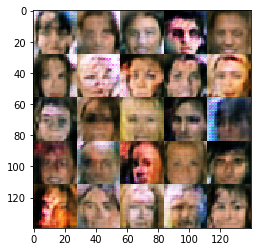

Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.7895
Epoch 5/5... Discriminator Loss: 1.3767... Generator Loss: 0.8004
Epoch 5/5... Discriminator Loss: 1.3740... Generator Loss: 0.8055
Epoch 5/5... Discriminator Loss: 1.3747... Generator Loss: 0.8010
Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.8007
Epoch 5/5... Discriminator Loss: 1.3717... Generator Loss: 0.8183
Epoch 5/5... Discriminator Loss: 1.3736... Generator Loss: 0.8012
Epoch 5/5... Discriminator Loss: 1.3761... Generator Loss: 0.7845
Epoch 5/5... Discriminator Loss: 1.3732... Generator Loss: 0.7847
Epoch 5/5... Discriminator Loss: 1.3743... Generator Loss: 0.8007


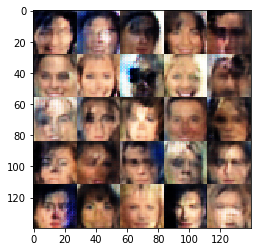

Epoch 5/5... Discriminator Loss: 1.3748... Generator Loss: 0.8025
Epoch 5/5... Discriminator Loss: 1.3773... Generator Loss: 0.7974
Epoch 5/5... Discriminator Loss: 1.3700... Generator Loss: 0.8070
Epoch 5/5... Discriminator Loss: 1.3733... Generator Loss: 0.8026
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.8040
Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.7975
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.7986
Epoch 5/5... Discriminator Loss: 1.3718... Generator Loss: 0.7947
Epoch 5/5... Discriminator Loss: 1.3748... Generator Loss: 0.7985
Epoch 5/5... Discriminator Loss: 1.3763... Generator Loss: 0.7938


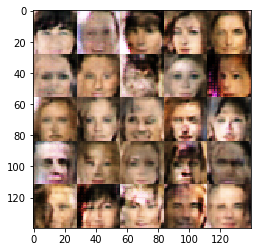

Epoch 5/5... Discriminator Loss: 1.3764... Generator Loss: 0.7997
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.8080
Epoch 5/5... Discriminator Loss: 1.3723... Generator Loss: 0.7974
Epoch 5/5... Discriminator Loss: 1.3733... Generator Loss: 0.7974
Epoch 5/5... Discriminator Loss: 1.3740... Generator Loss: 0.7920
Epoch 5/5... Discriminator Loss: 1.3774... Generator Loss: 0.7968
Epoch 5/5... Discriminator Loss: 1.3747... Generator Loss: 0.7998
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.8062
Epoch 5/5... Discriminator Loss: 1.3764... Generator Loss: 0.8075
Epoch 5/5... Discriminator Loss: 1.3731... Generator Loss: 0.8019


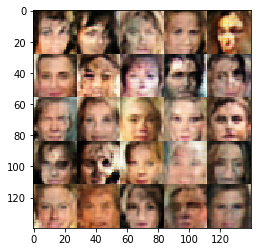

Epoch 5/5... Discriminator Loss: 1.3741... Generator Loss: 0.7988
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.7987
Epoch 5/5... Discriminator Loss: 1.3737... Generator Loss: 0.7911
Epoch 5/5... Discriminator Loss: 1.3736... Generator Loss: 0.7988
Epoch 5/5... Discriminator Loss: 1.3749... Generator Loss: 0.7986
Epoch 5/5... Discriminator Loss: 1.3741... Generator Loss: 0.8016
Epoch 5/5... Discriminator Loss: 1.3744... Generator Loss: 0.8005
Epoch 5/5... Discriminator Loss: 1.3738... Generator Loss: 0.8040
Epoch 5/5... Discriminator Loss: 1.3761... Generator Loss: 0.7960
Epoch 5/5... Discriminator Loss: 1.3751... Generator Loss: 0.8004


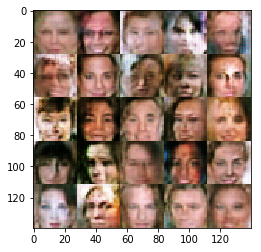

Epoch 5/5... Discriminator Loss: 1.3758... Generator Loss: 0.7944
Epoch 5/5... Discriminator Loss: 1.3745... Generator Loss: 0.8044
Epoch 5/5... Discriminator Loss: 1.3733... Generator Loss: 0.7971
Epoch 5/5... Discriminator Loss: 1.3735... Generator Loss: 0.8002
Epoch 5/5... Discriminator Loss: 1.3748... Generator Loss: 0.7991
Epoch 5/5... Discriminator Loss: 1.3764... Generator Loss: 0.7843
Epoch 5/5... Discriminator Loss: 1.3749... Generator Loss: 0.8014
Epoch 5/5... Discriminator Loss: 1.3754... Generator Loss: 0.8021
Epoch 5/5... Discriminator Loss: 1.3754... Generator Loss: 0.7948
Epoch 5/5... Discriminator Loss: 1.3771... Generator Loss: 0.7829


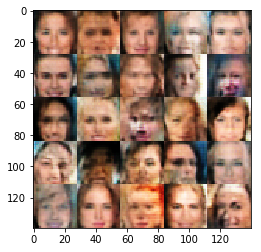

Epoch 5/5... Discriminator Loss: 1.3770... Generator Loss: 0.8313
Epoch 5/5... Discriminator Loss: 1.3727... Generator Loss: 0.8112
Epoch 5/5... Discriminator Loss: 1.3753... Generator Loss: 0.7852
Epoch 5/5... Discriminator Loss: 1.3753... Generator Loss: 0.8025
Epoch 5/5... Discriminator Loss: 1.3724... Generator Loss: 0.8021
Epoch 5/5... Discriminator Loss: 1.3715... Generator Loss: 0.7940
Epoch 5/5... Discriminator Loss: 1.3737... Generator Loss: 0.7979
Epoch 5/5... Discriminator Loss: 1.3724... Generator Loss: 0.8020
Epoch 5/5... Discriminator Loss: 1.3747... Generator Loss: 0.8018
Epoch 5/5... Discriminator Loss: 1.3727... Generator Loss: 0.8002


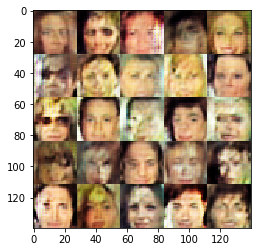

Epoch 5/5... Discriminator Loss: 1.3778... Generator Loss: 0.7976
Epoch 5/5... Discriminator Loss: 1.3784... Generator Loss: 0.7905
Epoch 5/5... Discriminator Loss: 1.3747... Generator Loss: 0.7362
Epoch 5/5... Discriminator Loss: 1.3730... Generator Loss: 0.8004
Epoch 5/5... Discriminator Loss: 1.3754... Generator Loss: 0.7963
Epoch 5/5... Discriminator Loss: 1.3715... Generator Loss: 0.8027
Epoch 5/5... Discriminator Loss: 1.3744... Generator Loss: 0.7997
Epoch 5/5... Discriminator Loss: 1.3758... Generator Loss: 0.7829
Epoch 5/5... Discriminator Loss: 1.3766... Generator Loss: 0.8237
Epoch 5/5... Discriminator Loss: 1.3740... Generator Loss: 0.8010


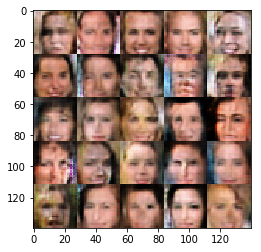

Epoch 5/5... Discriminator Loss: 1.3762... Generator Loss: 0.7985
Epoch 5/5... Discriminator Loss: 1.3757... Generator Loss: 0.7952
Epoch 5/5... Discriminator Loss: 1.3748... Generator Loss: 0.7968
Epoch 5/5... Discriminator Loss: 1.3751... Generator Loss: 0.7920
Epoch 5/5... Discriminator Loss: 1.3731... Generator Loss: 0.8014
Epoch 5/5... Discriminator Loss: 1.3749... Generator Loss: 0.7992
Epoch 5/5... Discriminator Loss: 1.3664... Generator Loss: 0.8091
Epoch 5/5... Discriminator Loss: 1.3709... Generator Loss: 0.7799
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.7964
Epoch 5/5... Discriminator Loss: 1.3754... Generator Loss: 0.7995


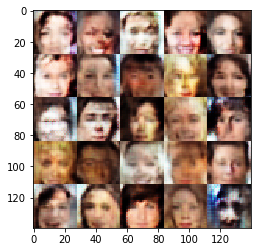

Epoch 5/5... Discriminator Loss: 1.3732... Generator Loss: 0.7853
Epoch 5/5... Discriminator Loss: 1.3762... Generator Loss: 0.7975
Epoch 5/5... Discriminator Loss: 1.3759... Generator Loss: 0.7990
Epoch 5/5... Discriminator Loss: 1.3770... Generator Loss: 0.8032
Epoch 5/5... Discriminator Loss: 1.3761... Generator Loss: 0.8111
Epoch 5/5... Discriminator Loss: 1.3755... Generator Loss: 0.7957
Epoch 5/5... Discriminator Loss: 1.3766... Generator Loss: 0.7957
Epoch 5/5... Discriminator Loss: 1.3755... Generator Loss: 0.7995
Epoch 5/5... Discriminator Loss: 1.3726... Generator Loss: 0.8104
Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.7973


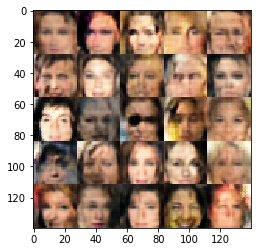

Epoch 5/5... Discriminator Loss: 1.3742... Generator Loss: 0.7985
Epoch 5/5... Discriminator Loss: 1.3749... Generator Loss: 0.8008
Epoch 5/5... Discriminator Loss: 1.3745... Generator Loss: 0.7972
Epoch 5/5... Discriminator Loss: 1.3762... Generator Loss: 0.7921
Epoch 5/5... Discriminator Loss: 1.3759... Generator Loss: 0.7989
Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.8018
Epoch 5/5... Discriminator Loss: 1.3706... Generator Loss: 0.8035
Epoch 5/5... Discriminator Loss: 1.3729... Generator Loss: 0.7660
Epoch 5/5... Discriminator Loss: 1.3760... Generator Loss: 0.7996
Epoch 5/5... Discriminator Loss: 1.3751... Generator Loss: 0.7821


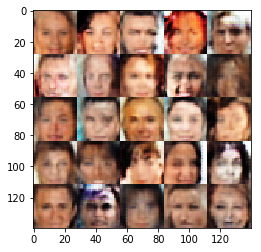

Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.7940
Epoch 5/5... Discriminator Loss: 1.3747... Generator Loss: 0.7991
Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.7998
Epoch 5/5... Discriminator Loss: 1.3739... Generator Loss: 0.7897
Epoch 5/5... Discriminator Loss: 1.3741... Generator Loss: 0.7957
Epoch 5/5... Discriminator Loss: 1.3754... Generator Loss: 0.8058
Epoch 5/5... Discriminator Loss: 1.3753... Generator Loss: 0.7985
Epoch 5/5... Discriminator Loss: 1.3765... Generator Loss: 0.8012
Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.7993
Epoch 5/5... Discriminator Loss: 1.3755... Generator Loss: 0.7997


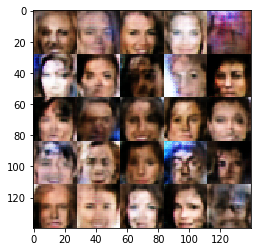

Epoch 5/5... Discriminator Loss: 1.3762... Generator Loss: 0.8078
Epoch 5/5... Discriminator Loss: 1.3761... Generator Loss: 0.7949
Epoch 5/5... Discriminator Loss: 1.3752... Generator Loss: 0.7962
Epoch 5/5... Discriminator Loss: 1.3791... Generator Loss: 0.7946
Epoch 5/5... Discriminator Loss: 1.3777... Generator Loss: 0.7542
Epoch 5/5... Discriminator Loss: 1.3762... Generator Loss: 0.8018
Epoch 5/5... Discriminator Loss: 1.3725... Generator Loss: 0.8208
Epoch 5/5... Discriminator Loss: 1.3712... Generator Loss: 0.8013
Epoch 5/5... Discriminator Loss: 1.3799... Generator Loss: 0.8054
Epoch 5/5... Discriminator Loss: 1.3766... Generator Loss: 0.8228


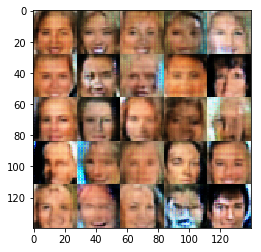

Epoch 5/5... Discriminator Loss: 1.3756... Generator Loss: 0.7964
Epoch 5/5... Discriminator Loss: 1.3765... Generator Loss: 0.7988


In [23]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.5
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)